In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
import matplotlib.pyplot as plt
from matplotlib.widgets import PolygonSelector
import matplotlib.path as mpltPath
import matplotlib.patches as patches
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import pprint

from crystals import Crystal
from orix.quaternion import Orientation, Rotation, symmetry
from orix import plot

githubpath = '/home/lheller/Documents/GitHub'
sys.path.append(githubpath)
#[sys.path.append(os.path.join(githubpath, x)) for x in os.listdir(githubpath)]
#
from crystlibs import *
from effelconst  import *
from getphases import *
from ebsdlib  import *
import pyebsd 


In [2]:
%matplotlib widget

# Definition of crystallographical system: structures of austenite and martensite, lattice correspondence, transformation deformation gradients, twinning systems
## Cubic Austenite - parent phase
Austenite lattice matrix $\mathbf{L}^A=\begin{bmatrix}a^A&0&0\\0&a^A&0\\0&0&a^A\end{bmatrix}$ (denoted as LA in the code) is determined by lattice parameter of austenite $a^A$ (denoted as aA in the code).  Austenite lattice matrix converts Miller indexes of austenite lattice directions $\mathbf{m}_{d[uvw]}^A=[u^A,v^A,w^A]^{\sf T}$ into real space coordinates $\mathbf{x}_{d[uvw]}^A=[x^A,y^A,z^A]_{d[uvw]}^{\sf T}=\mathbf{L}^A\ \mathbf{m}_{d[uvw]}^A$.
<br>
Inverse austenite lattice matrix $\mathbf{L}_I^A={\mathbf{L}^A}^{-1}$ (denoted as LIA in the code) converts real space directions into Miller indexes of austenite lattice directions $\mathbf{m}_{d[uvw]}^A=\mathbf{L}_I^A\ \mathbf{x}_{d[uvw]}^A$.<br>
Austenite metric tensor $\mathbf{G}^A={\mathbf{L}^A}^{\sf T}\mathbf{L}^A$ (denoted as GA in the code) enables us to compute the square of the Euclidean norm of austenite lattice direction $||\mathbf{x}_{d[uvw]}^A||^2= {\mathbf{m}_{d[uvw]}^A}^{\sf T}\ \mathbf{G}^A\ \mathbf{m}_{d[uvw]}^A$.
<br><br>
Reciprocal austenite lattice matrix $\mathbf{L}_r^A={{\mathbf{L}^A}^{-1}}^{\sf T}$ (denoted as LrA in the code) converts Miller indexes of austenite lattice planes $\mathbf{m}_{p(hkl)}^A=[h^A,k^A,l^A]^{\sf T}$ into real space coordinates of planes normals $\mathbf{x}_{p(hkl)}^A=[x^A,y^A,z^A]_{p(hkl)}^{\sf T}=\mathbf{L}_r^A\ \mathbf{m}_{p(hkl)}^A$.<br>
Inverse reciprocal austenite lattice matrix $\mathbf{L}_{rI}^A={\mathbf{L}_r^A}^{-1}$ (denoted as LrIA in the code) converts real space plane normals into Miller indexes of austenite lattice planes $\mathbf{m}_{p(hkl)}^A=\mathbf{L}_{rI}^A\ \mathbf{x}_{p(hkl)}^A$.<br>
Austenite reciprocal metric tensor $\mathbf{G}_r^A={\mathbf{G}^A}^{-1}$ (denoted as GrA in the code) enables us to compute the square of the Euclidean norm of interplanar distance $||\mathbf{x}_{p(hkl)}^A||^2= {\mathbf{m}_{p(hkl)}^A}^{\sf T}\ \mathbf{G}_r^A\ \mathbf{m}_{p(hkl)}^A$.
<br>
## Monoclinic martensite - product phase
Martensite lattice matrix $\mathbf{L}^M=\begin{bmatrix}a^M&0&c^M\cos{\beta^M}\\0&b^M&0\\0&0&c^M\sin{\beta^M}\end{bmatrix}$
(denoted as LM in the code) is determined by lattice parameters of monoclinic martensite $a^M$, $b^M$, $c^M$, $\beta^M$ (denoted as aM,bM,cM,betaM in the code).  Martensite lattice matrix converts Miller indexes of martensite lattice directions $\mathbf{m}_{d[uvw]}^M=[u^M,v^M,w^M]^{\sf T}$ into real space coordinates $\mathbf{x}_{d[uvw]}^M=[x^M,y^M,z^M]_{d[uvw]}^{\sf T}=\mathbf{L}^M\ \mathbf{m}_{d[uvw]}^M$.
<br>
Inverse martensite lattice matrix $\mathbf{L}_I^M={\mathbf{L}^M}^{-1}$ (denoted as LIM in the code) converts real space directions into Miller indexes of martensite lattice directions $\mathbf{m}_{d[uvw]}^M=\mathbf{L}_I^M\ \mathbf{x}_{d[uvw]}^M$.<br>
Martensite metric tensor $\mathbf{G}^M={\mathbf{L}^M}^{\sf T}\mathbf{L}^M$ (denoted as GM in the code) enables us to compute the square of the Euclidean norm of martensite lattice direction $||\mathbf{x}_{d[uvw]}^M||^2= {\mathbf{m}_{d[uvw]}^M}^{\sf T}\ \mathbf{G}^M\ \mathbf{m}_{d[uvw]}^M$.
<br><br>
Reciprocal martensite lattice matrix $\mathbf{L}_r^M={{\mathbf{L}^M}^{-1}}^{\sf T}$ (denoted as LrM in the code) converts Miller indexes of martensite lattice planes $\mathbf{m}_{p(hkl)}^M=[h^M,k^M,l^M]^{\sf T}$ into real space coordinates of planes normals $\mathbf{x}_{p(hkl)}^M=[x^M,y^M,z^M]_{p(hkl)}^{\sf T}=\mathbf{L}_r^M\ \mathbf{m}_{p(hkl)}^M$.<br>
Inverse reciprocal martensite lattice matrix $\mathbf{L}_{rI}^M={\mathbf{L}_r^M}^{-1}$ (denoted as LrIM in the code) converts real space plane normals into Miller indexes of martensite lattice planes $\mathbf{m}_{p(hkl)}^M=\mathbf{L}_{rI}^M\ \mathbf{x}_{p(hkl)}^M$.<br>
Martensite reciprocal metric tensor $\mathbf{G}_r^M={\mathbf{G}^M}^{-1}$ (denoted as GrM in the code) enables us to compute the square of the Euclidean norm of interplanar distance $||\mathbf{x}_{p(hkl)}^M||^2= {\mathbf{m}_{p(hkl)}^M}^{\sf T}\ \mathbf{G}_r^M\ \mathbf{m}_{p(hkl)}^M$.
# Lattice correspondence
Corespondance matrices for directions $\mathbf{C}_d^{M\xrightarrow i A}$ (denoted as Cd in the code) mapping martensite lattice directions $\mathbf{m}_{d[uvw]}^M$ into austenite ones $\mathbf{m}_{d[u_iv_iw_i]}^A$ and inversely using matrices $\mathbf{C}_d^{A\xrightarrow i M}={\mathbf{C}_d^{M\xrightarrow i A}}^{-1}$ (denoted as CId in the code), where $i=1\ldots 12$ denotes correspondence variants.<br>
similarly, for lattice plane normals. Corespondance matrices for planes $\mathbf{C}_p^{M\xrightarrow i A}$ (denoted as Cp in the code) mapping martensite lattice directions $\mathbf{m}_{p(hkl)}^M$ into austenite ones $\mathbf{m}_{p(h_ik_il_i)}^A$ and inversely using matrices $\mathbf{C}_p^{A\xrightarrow i M}={\mathbf{C}_p^{M\xrightarrow i A}}^{-1}$ (denoted as CIp in the code), where $i=1\ldots 12$ denotes correspondence variants.

In [ ]:
# -----------------------------------------------------------------------------
#  THE RECIPE  (edit here; everything downstream reads from it)
# -----------------------------------------------------------------------------
RECIPE = dict(
    # ---- data + crystallography (rebuilds dataEBSD; raw pixels re-read) ------
    filename = '/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan.ang',  # source .oh5 scan
    cif_A    = '/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/cifs/NiTi - pm3m.cif',    # austenite CIF (cubic Pm-3m)
    cif_M    = '/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/cifs/NiTiB19p.cif',       # martensite CIF (B19' monoclinic)
    aA = 3.015,                          # austenite lattice parameter a [Å] (Bhattacharya 2003)
    aM = 2.889, bM = 4.12, cM = 4.622,   # martensite lattice parameters a,b,c [Å]
    betaM = 96.8 * np.pi / 180,          # martensite monoclinic angle beta [rad] (96.8°)
    phaseID = {'A': 2, 'M': 3},          # map phase name -> phase id in the .oh5 data
    or_d    = [0, 0, 1],                 # sample direction passed to select_rois(d=...)
    roiID   = 1,                         # which ROI (region of interest) to analyse
    roi_verts = None,                    # stored ROI polygon vertices (filled by
                                         # finalize_rois); None => select interactively once

    # ---- clustering (MisorientationClustering) ------------------------------
    clustering = dict(
        ang_thr=2.5,                     # grain-boundary misorientation threshold [deg]
        dmax=3,                          # max neighbour distance searched when clustering [px]
        minidxs={'A': 50, 'M': 50},                 # min cluster size [px] per phase (e.g. [austenite, martensite])
        distance=1,                      # neighbour step used for pairwise misorientation [px]
        perimeteronly={'A': False, 'M': False},     # per phase: cluster on perimeter pixels only? (A=no, M=yes)
        distance_convention="OIM"),      # neighbour/distance convention ("OIM" grid convention)

    # ---- KAM / GND (KamGND) -------------------------------------------------
    kamgnd = dict(
        distance=2,                      # neighbour shell radius for KAM/GND [px]
        perimeteronly=False,             # use all pixels (not just cluster perimeters)
        maxmis=10),                      # max misorientation counted in KAM [deg] (caps outliers)

    # ---- lamellar-cluster identification (identify_lamellar_clusters) -------
    lamellar = dict(
        phase_id=2,                      # phase to test for lamellar shape (2 = martensite)
        min_aspect_ratio=10,             # min length/width for a cluster to count as a lamella
        use_hexagonal=True,              # treat scan grid as hexagonal in the shape analysis
        use_sklearn=True,                # use scikit-learn PCA for the elongation fit
        show_progress=True,              # print a progress bar
        min_width_threshold=0,           # min lamella width [px] (0 = no lower bound)
        min_pixesl_threshold=10),        # min pixel count for a cluster to be considered

    # ---- physical reconstruction (merge fragmented grains / lamellae) -------
    reconstruct_grains   = dict(
        threshold_deg=5.0),              # merge austenite fragments if disorientation < this [deg]
    reconstruct_lamellas = dict(
        threshold_deg=5.0,               # merge martensite fragments if disorientation < this [deg]
        angle_tol_deg=8.0,               # max angle between fragment principal directions [deg]
        collinearity_tol=1.0,            # max perpendicular offset, in units of mean lamella width
        gap_tol_factor=8.0),             # max end-to-end gap along the lamella, in units of mean width

    # ---- hierarchy + meeting pairs ------------------------------------------
    hierarchy = dict(
        filter_lamellar_to_semi_rois=True,  # split each lamella into its two long-side semi-ROIs
        semi_roi_params=None,            # semi-ROI geometry overrides (None = defaults)
        min_aspect_ratio=-0.1),          # aspect-ratio floor for inclusion (-0.1 = keep all)
    meeting   = dict(
        tip_distance_threshold=15.0),    # two lamella tips are a "meeting pair" if within this [px]

    # ---- downstream analysis params (report / OR / variant compatibility) ---
    params = dict(
        frag_merge_deg=2.0,              # austenite fragment-merge threshold used in the report [deg]
        lamella_merge_deg=2.0,           # martensite fragment-merge threshold used in the report [deg]
        oop_flag_deg=20.0,               # flag habit planes whose out-of-plane angle exceeds this [deg]
        or_preserved_deg=3.0,            # OR-residual threshold for "OR preserved" across a boundary [deg]
        tip_distance_px=15.0,            # tip-proximity threshold for boundary meeting pairs [px]
        ma_threshold_deg=2.0),           # martensite disorientation to group variants within a grain [deg]
)


# Loading EBSD and Selecting ROIs

Reading file "/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.19 s
Calculating rotation matrices... 0.04 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

Plotting Inverse Pole Figure... 0.14 s


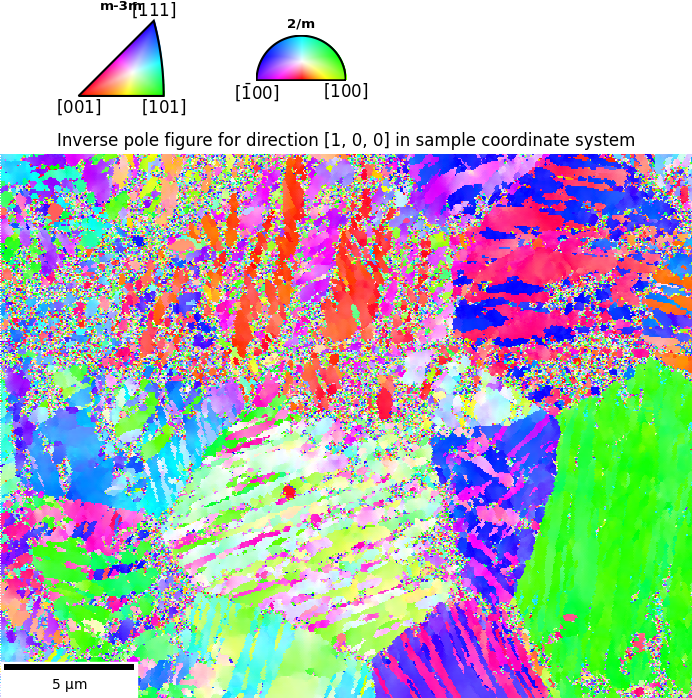

Click on the figure to create a polygon.
Press the 'esc' key to start a new polygon.
Try holding the 'shift' key to move all of the vertices.
Try holding the 'ctrl' key to move a single vertex.

>>> Draw ROI polygon(s) in the figure, then run:
>>>     finalize_rois(dataEBSD, RECIPE)
>>> (this stores the masks and saves the polygons into the recipe)



In [4]:

# -----------------------------------------------------------------------------
#  FULL PIPELINE (fresh analysis), all parameters read from `recipe`
# -----------------------------------------------------------------------------
recipe=RECIPE
c = recipe['clustering']
k = recipe['kamgnd']
verbose=True
checkpoint_path='auto'
"""Run the full analysis from a recipe.

checkpoint_path:
    None       -> do not save a checkpoint (default),
    'auto'     -> save to "<oh5 stem>_roi<ID>_checkpoint.h5" next to nothing
                    in particular (current dir); name derived from the recipe,
    <path str> -> save to that path.
"""
roiID = recipe['roiID']
pA, pM = recipe['phaseID']['A'], recipe['phaseID']['M']

# --- data + crystallography ---------------------------------------------
dataEBSD = build_dataEBSD(recipe, interactive=True)


In [5]:
finalize_rois(dataEBSD, RECIPE)

stored 5 ROI polygon(s) in recipe['roi_verts']


In [6]:
dataEBSD.rois.masks_by_phase

[{'A': array([False, False, False, ...,  True,  True, False]),
  'M': array([False, False, False, ..., False, False, False])},
 {'A': array([False, False, False, ..., False, False, False]),
  'M': array([False, False, False, ..., False, False, False])}]

## Show all ROIs

Plotting Inverse Pole Figure... 0.19 s


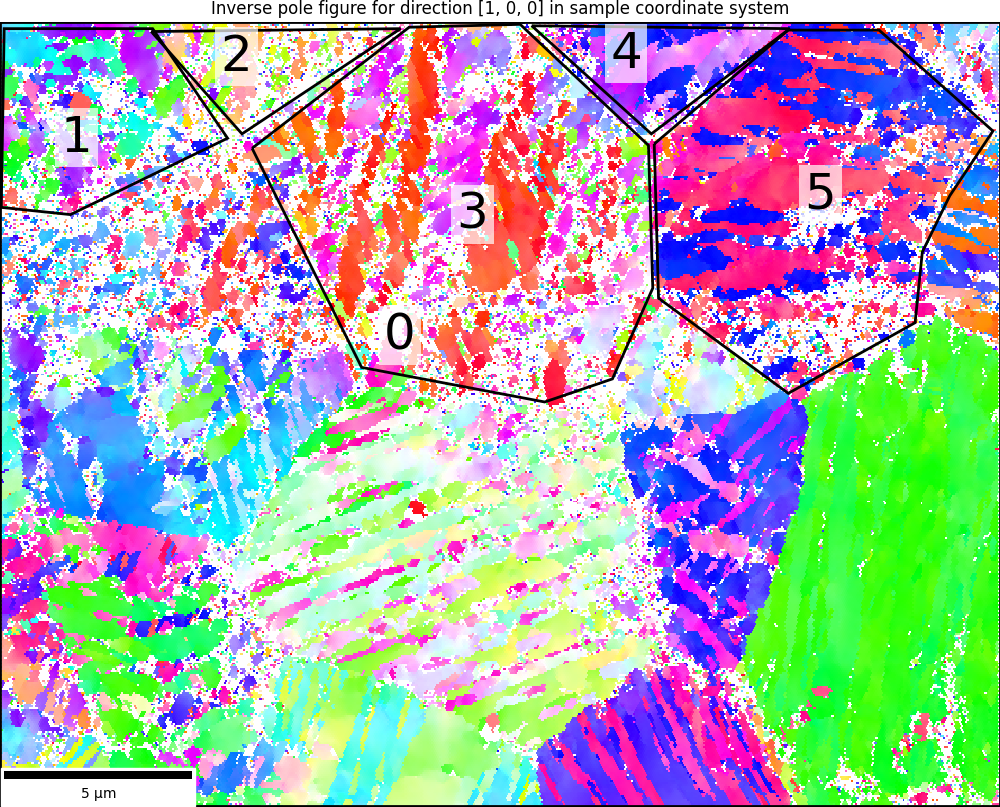

In [6]:
fig,AX = plt.subplots(1,figsize=(10,10))
fig,ax = dataEBSD.plot_IPF(ax=AX,fig=fig,d=[1,0,0],phase='A',colorcode=False)
for roiID in range(0,len(dataEBSD.rois.masks_by_phase)):
    patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None',edgecolor='k', lw=2)
    com=np.mean(dataEBSD.selector.selVerts[roiID],axis=0)
    ax.add_patch(patch)
    ax.text(com[0], com[1],f'{roiID}', fontsize=36, color='k', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

## Save ROIs

In [7]:
fileext = 'my_rois'
if 'ang' in RECIPE['filename']:
    save_rois_only(RECIPE['filename'].replace('.ang',f'_{fileext}.h5'), dataEBSD)
elif 'oh5' in RECIPE['filename']:
    save_rois_only(RECIPE['filename'].replace('.oh5',f'_{fileext}.h5'), dataEBSD)

ROIs saved -> /home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan_my_rois.h5


## Add ROIs

In [ ]:
# add a third ROI
add_rois_interactive(dataEBSD, roi_d=recipe['or_d'], show_current=False)

In [ ]:
finalize_added_rois(dataEBSD, recipe=recipe)

## Remove ROIs

In [13]:
#remove_roi(dataEBSD, roi_index=2, recipe=recipe)

# Reload just ROIs

In [21]:
recipe=RECIPE
c = recipe['clustering']
k = recipe['kamgnd']



dataEBSD = rebuild_dataEBSD(recipe, checkpoint_path='/home/lheller/Documents/GitHub/ebsdlib/notebooks/data/R18SA-30def-500CEpulse-center-Area1_Rescan_my_rois.h5')
print("after rebuild:", len(dataEBSD.rois.masks), len(dataEBSD.selector.selPaths))

recipe['roi_verts']  = get_roi_verts(dataEBSD)
print("after get_roi_verts:", len(dataEBSD.rois.masks), len(dataEBSD.selector.selPaths))

Reading file "/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.18 s
Calculating rotation matrices... 0.04 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

after rebuild: 16 16
after get_roi_verts: 16 16


## Show stored ROIs

Plotting Inverse Pole Figure... 0.19 s


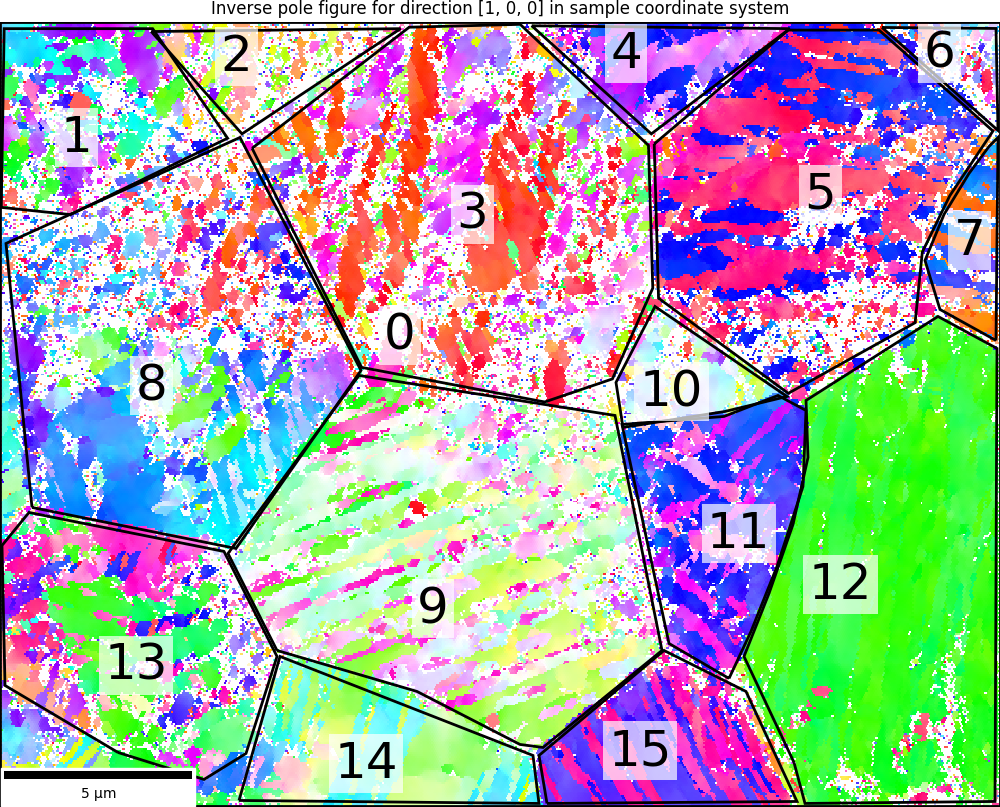

In [22]:
fig,AX = plt.subplots(1,figsize=(10,10))
fig,ax = dataEBSD.plot_IPF(ax=AX,fig=fig,d=[1,0,0],phase='A',colorcode=False)
for roiID in range(0,len(dataEBSD.rois.masks_by_phase)):
    patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None',edgecolor='k', lw=2)
    com=np.mean(dataEBSD.selector.selVerts[roiID],axis=0)
    ax.add_patch(patch)
    ax.text(com[0], com[1],f'{roiID}', fontsize=36, color='k', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

In [ ]:
#renumber_rois(dataEBSD, [1,2,3,4,5,6,8,9,10,11,12,13,14,15,7], recipe=recipe)

ROIs renumbered. New mapping: old 1 -> new 1, old 2 -> new 2, old 3 -> new 3, old 4 -> new 4, old 5 -> new 5, old 6 -> new 6, old 8 -> new 7, old 9 -> new 8, old 10 -> new 9, old 11 -> new 10, old 12 -> new 11, old 13 -> new 12, old 14 -> new 13, old 15 -> new 14, old 7 -> new 15


In [ ]:
#move_roi_to_position(dataEBSD, 15, 7, recipe=recipe)

stored 15 ROI polygon(s) in recipe['roi_verts'] (reordered)
ROIs renumbered. New mapping: old 1 -> new 1, old 2 -> new 2, old 3 -> new 3, old 4 -> new 4, old 5 -> new 5, old 6 -> new 6, old 15 -> new 7, old 7 -> new 8, old 8 -> new 9, old 9 -> new 10, old 10 -> new 11, old 11 -> new 12, old 12 -> new 13, old 13 -> new 14, old 14 -> new 15


## Add ROIs

Plotting Inverse Pole Figure... 0.23 s


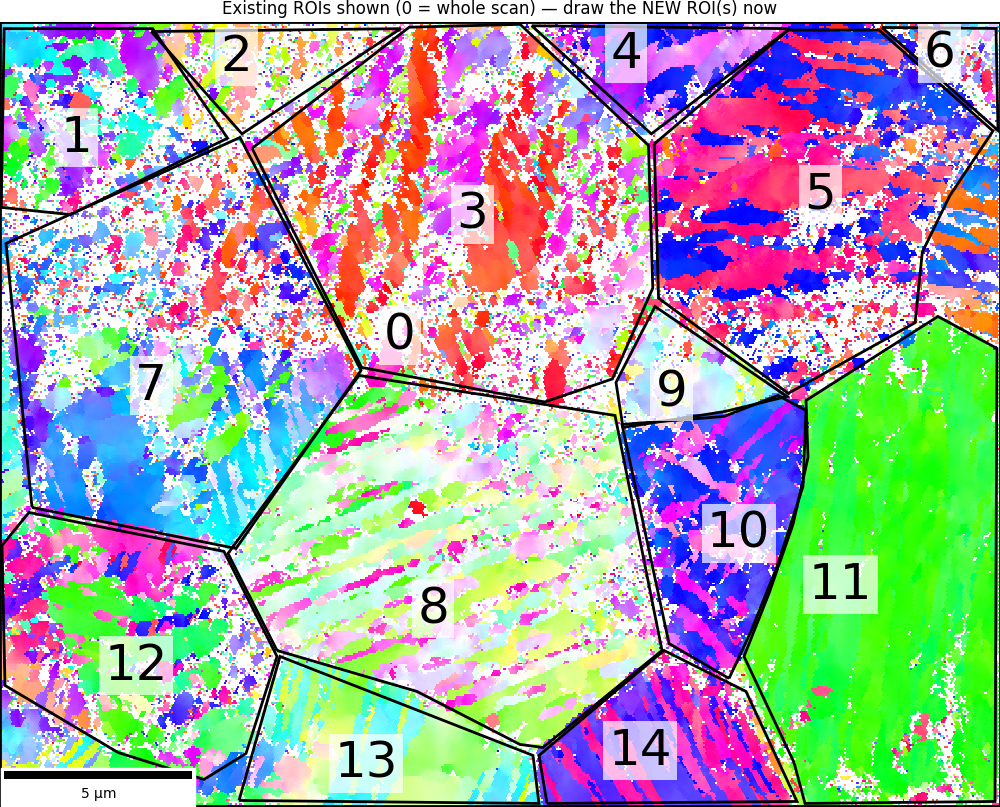

Draw the NEW ROI polygon(s), then call finalize_added_rois(dataEBSD, recipe).


In [6]:
# add a third ROI
add_rois_interactive(dataEBSD, roi_d=recipe['or_d'], show_current=True)

In [7]:
finalize_added_rois(dataEBSD, recipe=recipe)

stored 15 ROI polygon(s) in recipe['roi_verts']
Total real ROIs now: 15 (roiID 1..15; roiID 0 is the whole-scan placeholder).


## Remove ROIs

In [14]:
#remove_roi(dataEBSD, roi_index=2, recipe=recipe)

## Save ROIs

In [11]:
fileext = 'my_rois'
if 'ang' in RECIPE['filename']:
    save_rois_only(RECIPE['filename'].replace('.ang',f'_{fileext}.h5'), dataEBSD)
elif 'oh5' in RECIPE['filename']:
    save_rois_only(RECIPE['filename'].replace('.oh5',f'_{fileext}.h5'), dataEBSD)

ROIs saved -> /home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan_my_rois.h5


In [12]:
RECIPE['filename']

'/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan.ang'

# Reload ROIs and data

In [5]:
state = load_checkpoint('/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan_2grains_selection_checkpoint.h5')

dataEBSD          = state['dataEBSD']
clustering_result = state['clustering_result']
boundary_result    = state['boundary_result']
hierarchy          = state['hierarchy']
hpa                = state['hpa']
or_results         = state['or_results']
aux                = state['aux']
recipe             = state['recipe']

c = recipe['clustering']
k = recipe['kamgnd']
merge_groups_all = aux.get('merge_groups_all')


Reading file "/home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan.ang"...
# GRID: HexGrid
# XSTEP: 0.060000
# YSTEP: 0.051962
# NCOLS_ODD: 445
# NCOLS_EVEN: 444
# NROWS: 403

179134 points read in 0.17 s
Calculating rotation matrices... 0.07 s


/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall_number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['hall']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['international']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd/lib/python3.12/site-packages/spglib/spglib.py:115: DeprecationWarning: dict interface (SpglibDataset['number']) is deprecated.Use attribute interface ({self.__class__.__name__}.{key}) instead
  warnings.warn(
/home/lheller/.conda/envs/ebsd

## Show selected ROI

In [21]:
recipe['roiID']

1

Plotting Inverse Pole Figure... 0.30 s
Plotting Inverse Pole Figure... 0.25 s


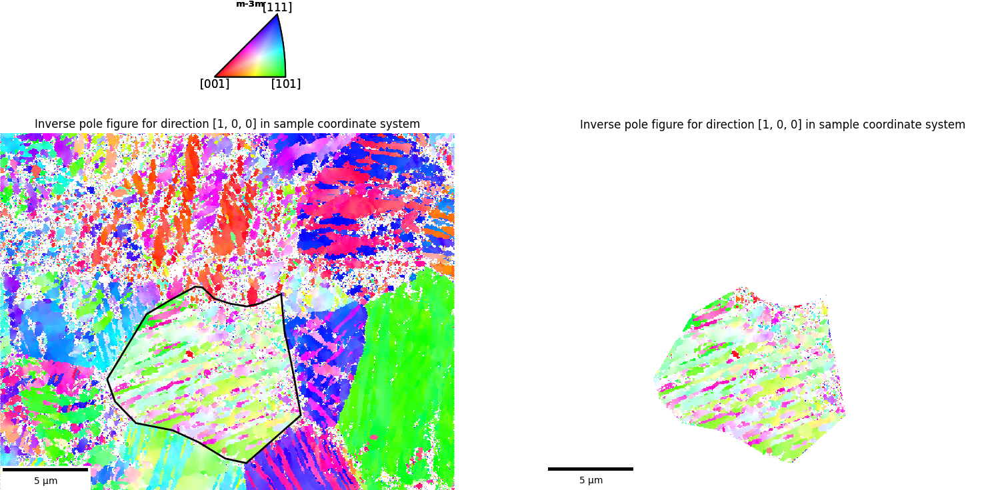

In [6]:

fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],phase='A')
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='A',globalScale=True)

In [10]:
dataEBSD.rois.masks_by_phase

[{'A': array([False, False, False, ...,  True,  True, False]),
  'M': array([False, False, False, ..., False, False, False])},
 {'A': array([False, False, False, ..., False, False, False]),
  'M': array([False, False, False, ..., False, False, False])},
 {'A': array([False, False, False, ..., False, False, False]),
  'M': array([False, False, False, ..., False, False, False])}]

## Show all ROIs

Plotting Inverse Pole Figure... 0.26 s


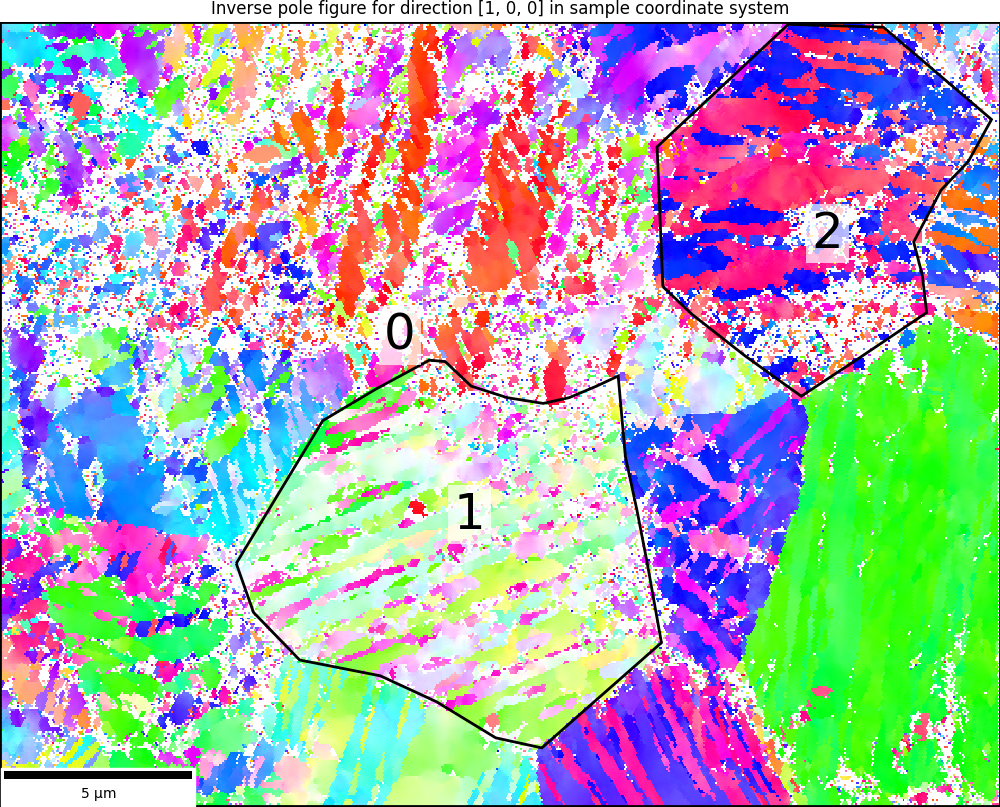

In [7]:

fig,AX = plt.subplots(1,figsize=(10,10))
fig,ax = dataEBSD.plot_IPF(ax=AX,fig=fig,d=[1,0,0],phase='A',colorcode=False)
for roiID in range(0,len(dataEBSD.rois.masks_by_phase)):
    patch = patches.PathPatch(dataEBSD.selector.selPaths[roiID], facecolor='None',edgecolor='k', lw=2)
    com=np.mean(dataEBSD.selector.selVerts[roiID],axis=0)
    ax.add_patch(patch)
    ax.text(com[0], com[1],f'{roiID}', fontsize=36, color='k', ha='center', va='center', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))


Plotting Inverse Pole Figure... 0.10 s
Plotting Inverse Pole Figure... 0.16 s


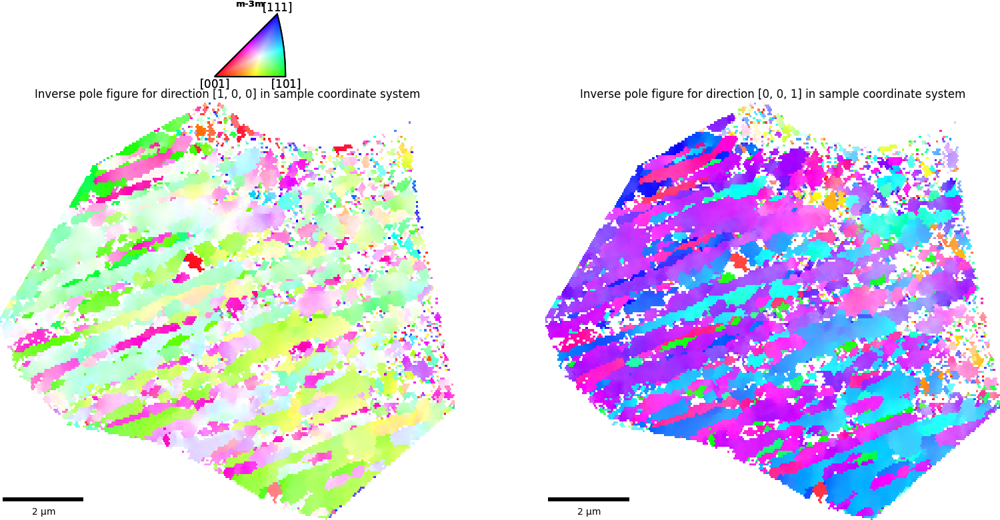

In [9]:

fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='A',globalScale=False)
fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[0,0,1],roi=recipe['roiID'],phase='A',globalScale=False)
#fig,AX = plt.subplots(1,2,figsize=(15,10))
#fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='M',globalScale=False)
#fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[0,0,1],roi=recipe['roiID'],phase='M',globalScale=False)

# Modify ROI ID

Plotting Inverse Pole Figure... 0.19 s
Plotting Inverse Pole Figure... 0.19 s


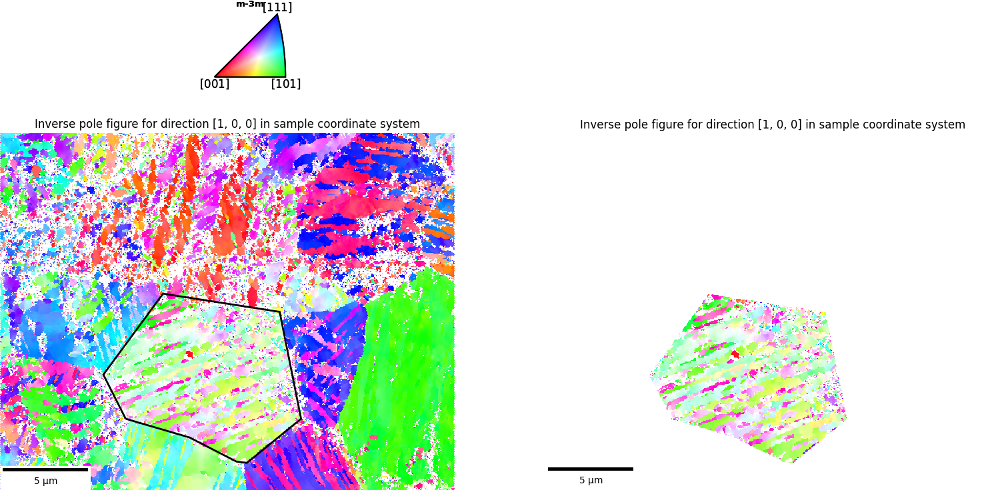

In [8]:
recipe['roiID']  = 9

fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],phase='A')
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
fig,ax = dataEBSD.plot_IPF(ax=AX[1],fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='A',globalScale=True)

# Clustering

In [9]:
# --- clustering ----------------------------------------------------------
alg = MisorientationClustering(
    ang_thr=c['ang_thr'], dmax=c['dmax'], minidxs=c['minidxs'], roi=recipe['roiID'],
    distance=c['distance'], perimeteronly=c['perimeteronly'],
    distance_convention=c['distance_convention'])
clustering_result = alg.fit(dataEBSD)
clustering_result = clustering_result.symmetrize_clusters(
    cluster_ids='all', phase='A',
    return_clustering_result=True
)
dataEBSD.set_rois2d(recipe['roiID'])
clustering_result.update_grid_2d()


Clustering 2 phases sequentially...
  Phase 2... 64 clusters
  Phase 3... 0 clusters
Total: 64 clusters across all phases


Plotting Inverse Pole Figure... 0.21 s
Plotting Inverse Pole Figure... 0.16 s


(None, <Axes: >)

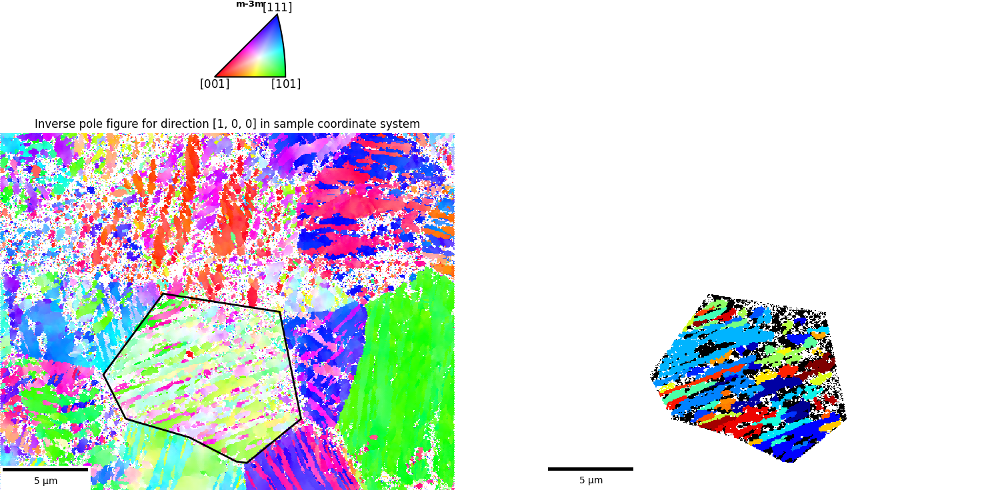

In [10]:
fig,AX = plt.subplots(1,2,figsize=(15,10))
fig,ax = dataEBSD.plot_IPF(ax=AX[0],fig=fig,d=[1,0,0],phase='A')
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
#fig,AX = plt.subplots(1,1,figsize=(10,8))
visualizer = EBSDVisualizer()
visualizer.plotClusters(clustering_result, ax=AX[1], globalScale=True, tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster')

## Misorientation at grain boundaries

(2374,) (2374, 2)
[[1 2]
 [1 2]
 [1 2]
 [1 4]
 [1 4]
 [1 4]
 [1 2]
 [1 2]
 [1 2]
 [1 4]]
(61,)


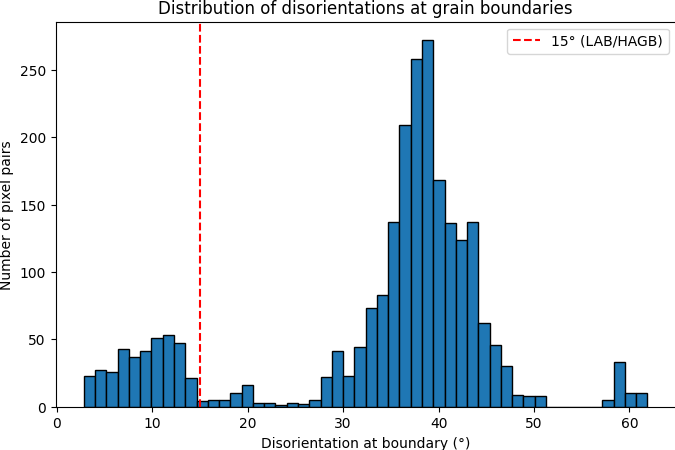

Médiane: 37.69°
Fraction < 15°: 15.5%
Fraction > 15°: 84.5%


In [11]:
if 'hex' in dataEBSD._ebsdData.grid.lower():
    distance_convention='OIM'
else:
    distance_convention='rect'

misori, pair_cluster_ids = clustering_result.get_pixel_boundary_misorientations(
    phase='A', distance=1, perimeteronly=False, distance_convention=distance_convention
)
print(misori.shape, pair_cluster_ids.shape)
print(pair_cluster_ids[:10])
print(np.unique(pair_cluster_ids.reshape(-1)).shape)  # nb de clusters impliqués dans au moins un joint



import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.hist(misori, bins=50, edgecolor='black')
plt.axvline(15, color='red', linestyle='--', label='15° (LAB/HAGB)')
plt.xlabel('Disorientation at boundary (°)')
plt.ylabel('Number of pixel pairs')
plt.legend()
plt.title('Distribution of disorientations at grain boundaries')
plt.show()

print(f"Médiane: {np.median(misori):.2f}°")
print(f"Fraction < 15°: {(misori < 15).mean()*100:.1f}%")
print(f"Fraction > 15°: {(misori >= 15).mean()*100:.1f}%")

Plotting Inverse Pole Figure... 0.17 s


(0.0, 70.0)

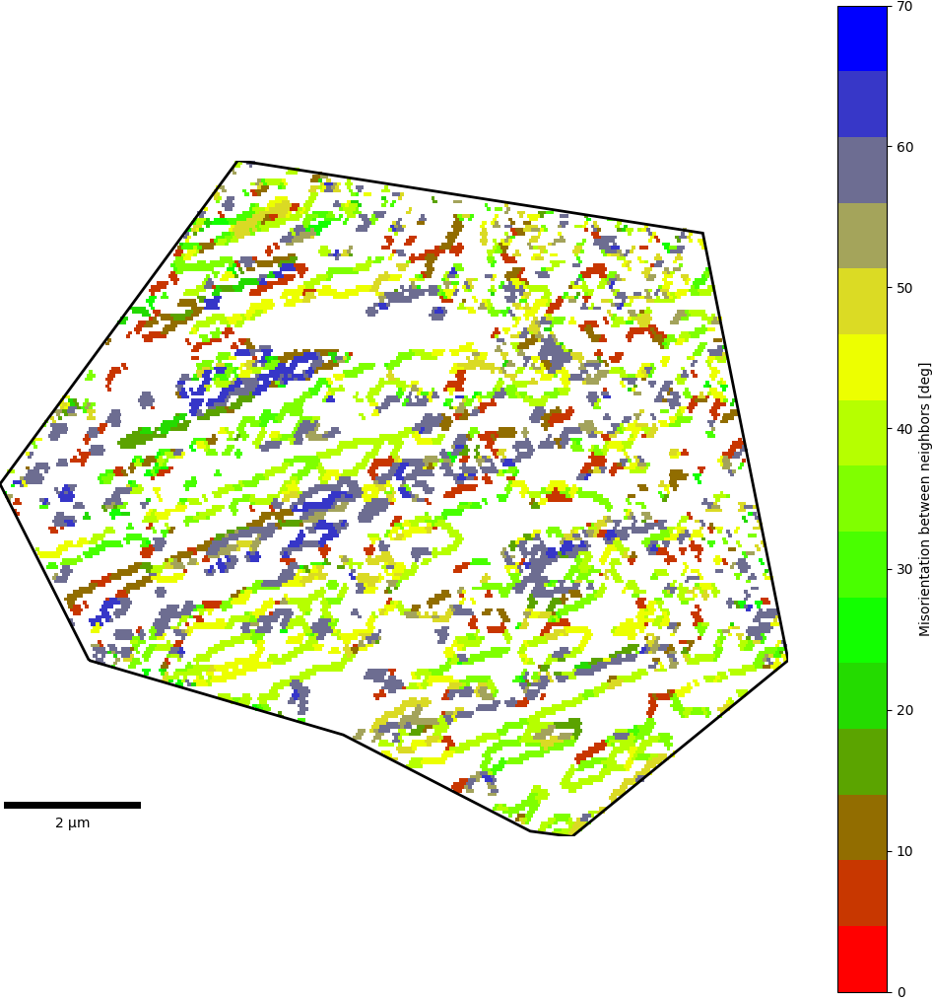

In [12]:
if 'hex' in dataEBSD._ebsdData.grid.lower():
    distance_convention='OIM'
else:
    distance_convention='rect'

misang = clustering_result.get_pixel_max_neighbor_misorientation(
    'A', distance=1, perimeteronly=True,
    distance_convention=distance_convention, roi=recipe['roiID']
)
cmap = get_cmap([(1, 0, 0),(0, 1, 0),(1, 1, 0),(0, 0, 1)],nbins=15)
Colors = get_colors(misang,cmap,vmin=0,vmax=70)
Colors[misang<5] = [  0,   0,   0, 0]
norm = mpl.colors.Normalize(vmin=0, vmax=70)
fig,ax = plt.subplots(1,figsize=(10,10))
#fig,ax = dataEBSD.plot_IPF(ax=ax,fig=fig,d=[1,0,0],phase='A',roi=recipe['roiID'],globalScale=False,alpha=0.5)
fig,ax = dataEBSD.plot_colmap(ax=ax,fig=fig,roi=recipe['roiID'],phase='A',color=Colors,globalScale=False)
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             ax=ax, orientation='vertical', label='Misorientation between neighbors [deg]')
cbar.ax.set_ylim((0,70))


Plotting Inverse Pole Figure... 0.15 s
Plotting Inverse Pole Figure... 0.11 s


(0.0, 70.0)

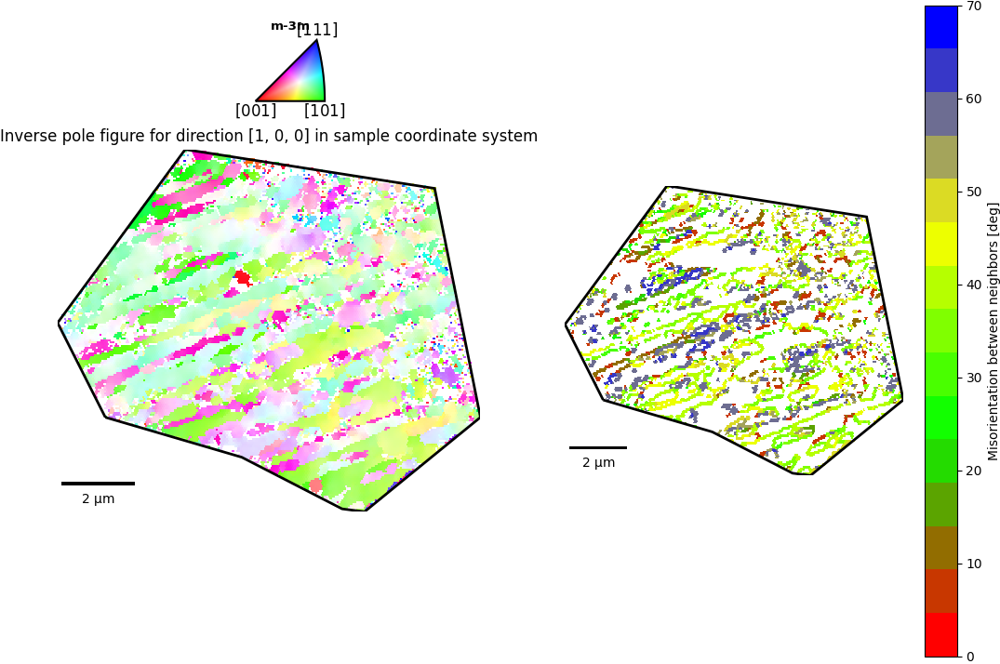

In [13]:
fig,AX = plt.subplots(1,2,figsize=(10,7))
ax=AX[0]
fig,ax = dataEBSD.plot_IPF(ax=ax,fig=fig,d=[1,0,0],roi=recipe['roiID'],phase='A',globalScale=False)
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
ax=AX[1]
fig,ax = dataEBSD.plot_colmap(ax=ax,fig=fig,roi=recipe['roiID'],phase='A',color=Colors,globalScale=False)
patch = patches.PathPatch(dataEBSD.selector.selPaths[recipe['roiID']], facecolor='None',edgecolor='k', lw=2)
ax.add_patch(patch)
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             ax=ax, orientation='vertical', label='Misorientation between neighbors [deg]')
cbar.ax.set_ylim((0,70))

# Get common lattice direction of clusters

 Cluster   Pixels  Mean (deg)  Std (deg)  Max (deg)
----------------------------------------------------
       6     2806       3.189      2.102     10.405
      27     1419       1.840      1.151      6.726
      58     1389       2.624      1.316      7.229
      51      918       2.297      1.222      6.297
      36      833       2.255      1.103      5.192
      26      488       3.430      1.500      9.157
      21      459       1.983      1.017      5.603
      29      393       4.497      2.415      9.425
      38      390       2.076      1.133      5.201
      47      357       1.515      0.909      5.315
      61      355       2.485      1.068      4.987
      59      257       1.640      0.978      4.725
      52      242       1.807      0.671      3.315
      32      211       1.582      1.162      4.161
      30      204       1.413      0.879      4.405
      42      202       2.634      1.877      6.496
      33      195       2.531      1.188      5.830
       4   

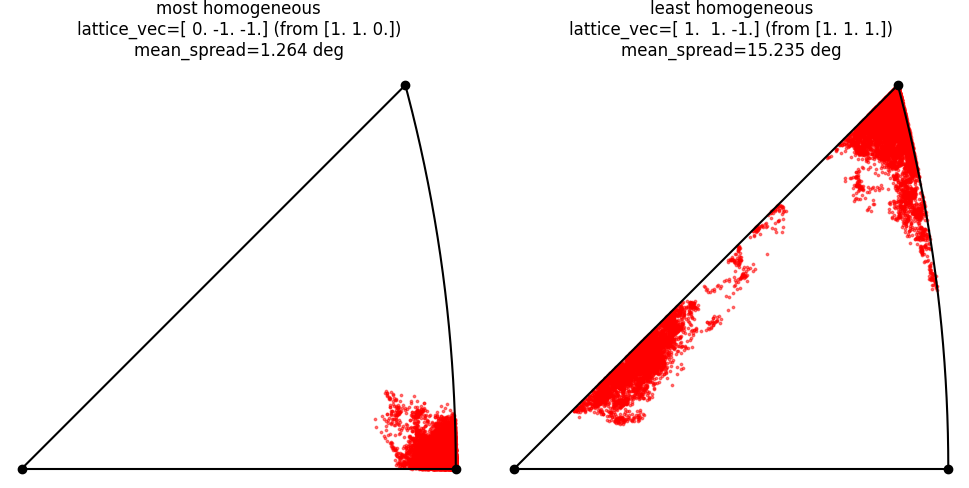

In [14]:
summary = clustering_result.print_pixel_to_average_misorientation_summary(cluster_ids=None,sort_by='n_pixels')
cluster1 = list(summary.keys())[0]
results = clustering_result.evaluate_lattice_direction_homogeneity(
    anchor_cluster_id=cluster1, lattice_vec=[[1,0,0],[1, 1, 0],[1,1,1]], phase='A',
    cluster_ids='all', units='deg', print_result=True, plot_result=True
)
zone_axis = results[0]['lattice_vec']
print("")
print(f"The shared lattice direction is probably {zone_axis}")


Plotting Inverse Pole Figure... 0.18 s


(<Figure size 900x800 with 2 Axes>,
 <Axes: title={'center': 'Inverse pole figure for direction [-0.44774045  0.89289715 -0.0475727 ] in sample coordinate system'}>)

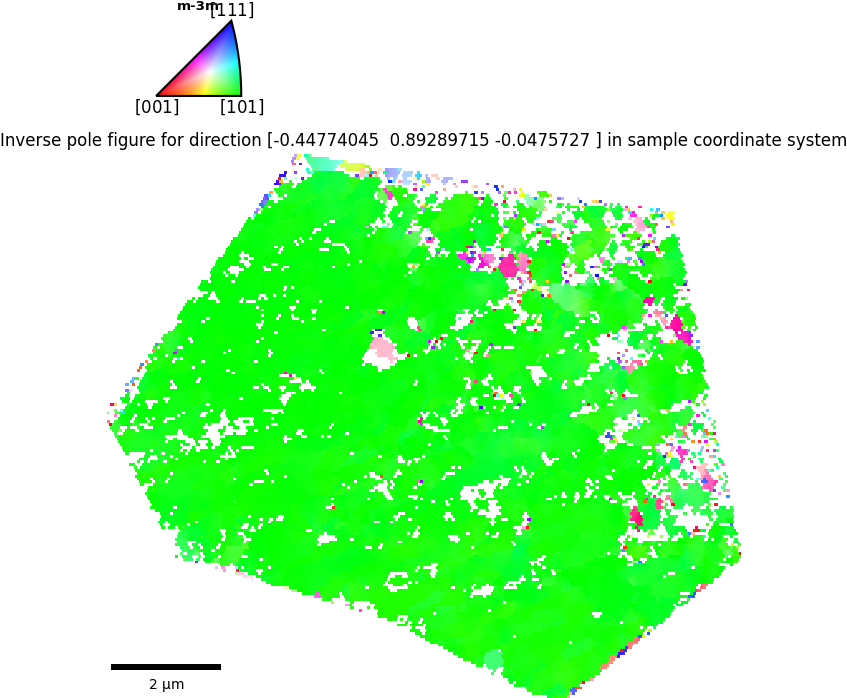

In [15]:
phase = 'A'
symops = clustering_result.data.phases[phase]['symops']

cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
cartesian_vec = clustering_result.data.phases[phase]['L'].dot(zone_axis)
cartesian_vec/=np.linalg.norm(cartesian_vec)
d = clustering_result.get_cluster_pixel_orientations(cluster_id=cluster1)['avg_mat'].T.dot(cartesian_vec)
visualizer = EBSDVisualizer()
visualizer.plotClusters(clustering_result,d=d, tiling=None, roi=recipe['roiID'], phase=phase,color_by='ipf',globalScale=False)

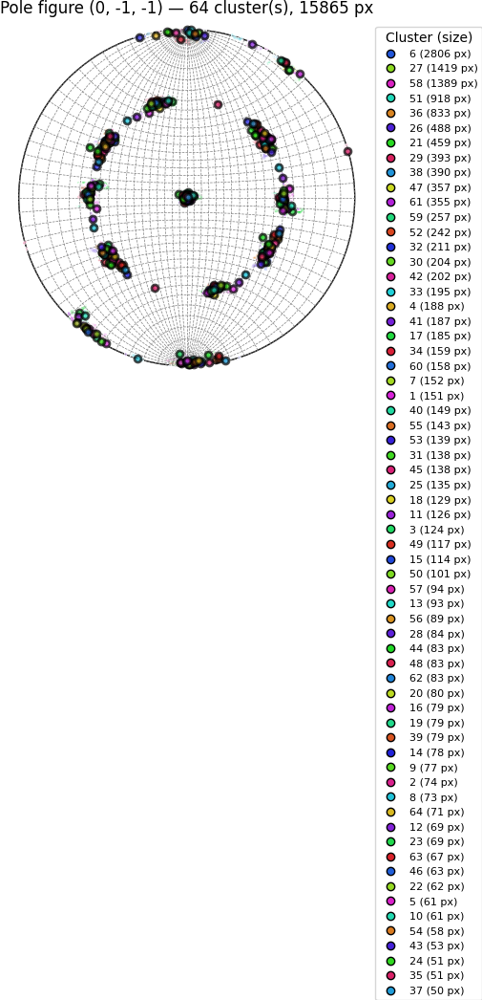

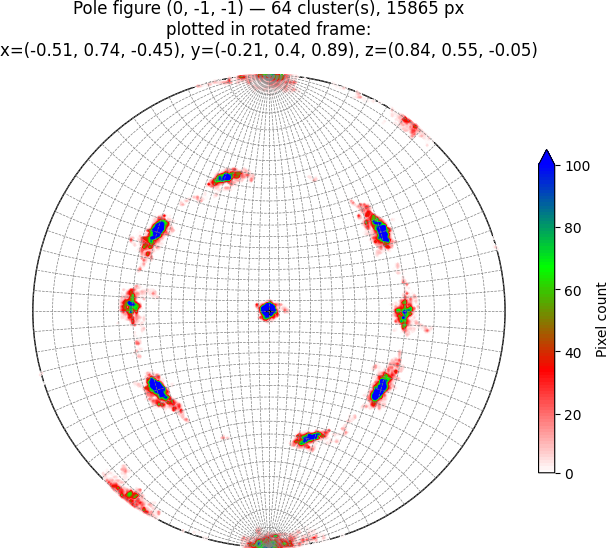

In [16]:
sample_transform = clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)

fig, ax = clustering_result.plot_cluster_pole_figure(cluster_id='all', phase='A', uvw=zone_axis, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = clustering_result.plot_cluster_pole_figure(cluster_id='all', phase='A', uvw=zone_axis, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 



Text(0.5, 1.0, 'All-pairs cluster misorientation — A, 64 clusters, 2016 pairs')

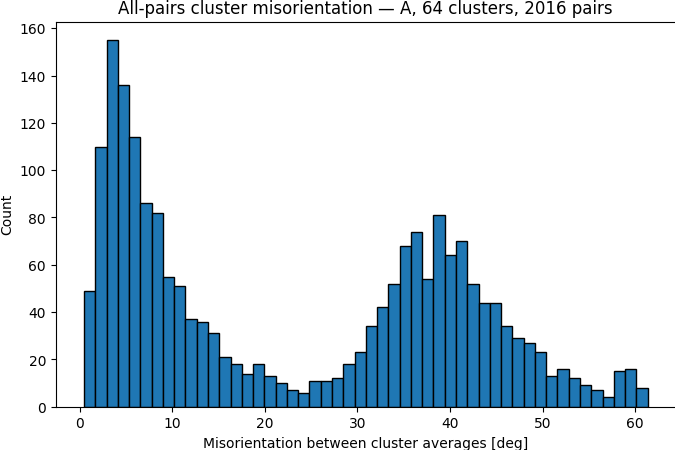

In [17]:
phase = 'A'
min_size = c['minidxs'][phase]

sizes = clustering_result.cluster_sizes
cluster_ids = [c for c in clustering_result.labels_by_phase[phase]
               if sizes.get(c, 0) >= min_size and c in clustering_result.avg_orientations]

M = np.array([clustering_result.avg_orientations[c] for c in cluster_ids])
symops = list(np.array(clustering_result.data.phases[phase]['symops']))

D = np.asarray(disorimat(M, symops), dtype=float)  # (N, N)
iu = np.triu_indices(len(cluster_ids), k=1)
angles = D[iu]

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(angles, bins=50, edgecolor='black')
ax.set_xlabel('Misorientation between cluster averages [deg]')
ax.set_ylabel('Count')
ax.set_title(f'All-pairs cluster misorientation — {phase}, {len(cluster_ids)} clusters, {len(angles)} pairs')

# Merge clusters by orientation

Plotting Inverse Pole Figure... 0.13 s
Plotting Inverse Pole Figure... 0.16 s


Text(0.5, 1.0, 'After merging')

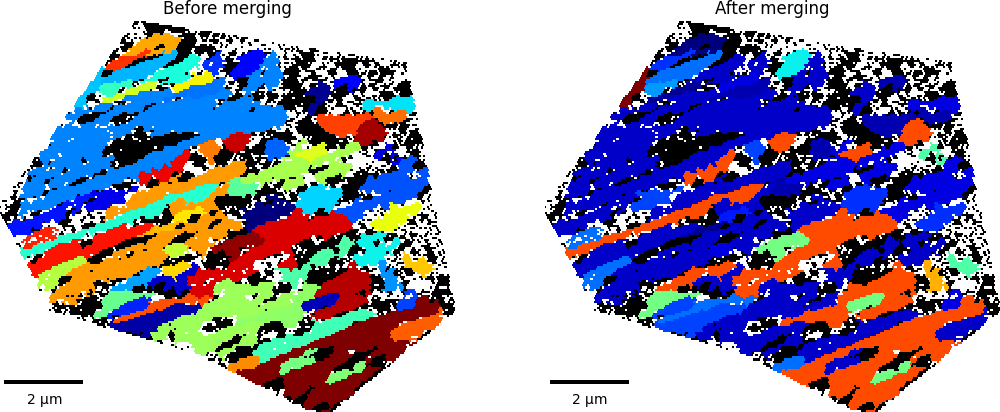

In [18]:
merged_clustering_result, merge_groups_all  = clustering_result.merge_clusters_by_orientation(threshold_deg=5.0, phase='A', min_size='recipe')
fig,AX = plt.subplots(1,2,figsize=(10,7))
visualizer = EBSDVisualizer()
visualizer.plotClusters(clustering_result, ax=AX[0], tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[0].set_title("Before merging")
visualizer = EBSDVisualizer()
visualizer.plotClusters(merged_clustering_result, ax=AX[1], tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[1].set_title("After merging")

In [19]:
merged_roots = [r for r, frags in merge_groups_all['A'].items() if len(frags) > 1]
all_cluster_ids = list(merged_clustering_result.labels_by_phase['A'])
summary = merged_clustering_result.print_pixel_to_average_misorientation_summary(cluster_ids=merged_roots,sort_by='n_pixels')

 Cluster   Pixels  Mean (deg)  Std (deg)  Max (deg)
----------------------------------------------------
       5     7347       3.062      1.680     10.386
      18     3790       2.880      1.497      8.859
       9     1249       2.912      1.388      9.364
       4      615       2.338      1.038      7.668
      10      615       3.251      1.546      8.561
      22      551       1.801      0.830      4.556
      40      448       1.814      0.963      5.153
       2      437       2.941      1.375      6.861
      24      134       2.540      0.889      4.694
      14      128       1.834      0.715      3.434


In [19]:

merged_clustering_result = merged_clustering_result.symmetrize_clusters(
    cluster_ids='all', phase='A', reference_cluster_id=merged_roots[0],
    return_clustering_result=True
)

# Twin  analysis

## Identify twins among merged clusters

In [58]:
# returned matches sorted by size (largest reconstructed grains first)
pairs_results, matches = merged_clustering_result.map_twin_relationships(
    phase='A', system='NiTi', modes=['115','114','113','112','111'], tol_deg=5.0, min_size='recipe',
    sort_by='size',print_result=True
)


   #  Cluster A     Px A  Cluster B     Px B     Mode                   Conditions   Axis dev  Angle dev  Match
--------------------------------------------------------------------------------------------------------------------------
   0          6     7259         19     3785      114     K1_180+eta1_180+K2_shear      1.05°      0.25°    yes
   1          6     7259         11      615      114     K1_180+eta1_180+K2_shear      1.90°      0.95°    yes
   2          6     7259         23      539      115     K1_180+eta1_180+K2_shear      0.59°      0.20°    yes
   3          2      142          6     7259      115              K1_180+eta1_180      1.96°      0.95°    yes
   4          6     7259         49       83      114              K1_180+eta1_180      2.14°      0.35°    yes
   5          6     7259         13       69      115              K1_180+eta1_180      4.36°      0.69°    yes
   6          6     7259         36       51      112     K1_180+eta1_180+K2_shear      1.61°

## Identify twins among nonmerged clusters

In [50]:
# returned matches sorted by size (largest reconstructed grains first)
notmerged_pairs_results, notmerged_matches = clustering_result.map_twin_relationships(
    phase='A', system='NiTi', modes=['115','114','113','112','111'], tol_deg=5.0, min_size='recipe',
    sort_by='size',print_result=True
)

   #  Cluster A     Px A  Cluster B     Px B     Mode                   Conditions   Axis dev  Angle dev  Match
--------------------------------------------------------------------------------------------------------------------------
   0          7     2754         59     1380      114     K1_180+eta1_180+K2_shear      1.31°      0.23°    yes
   1          7     2754         37      833      114     K1_180+eta1_180+K2_shear      1.62°      0.26°    yes
   2          7     2754         30      397      114     K1_180+eta1_180+K2_shear      0.83°      0.06°    yes
   3          7     2754         48      357      114     K1_180+eta1_180+K2_shear      0.79°      0.55°    yes
   4          7     2754         60      245      115     K1_180+eta1_180+K2_shear      0.80°      0.68°    yes
   5          7     2754         53      242      114     K1_180+eta1_180+K2_shear      1.01°      1.67°    yes
   6          7     2754         18      185      114              K1_180+eta1_180      2.97°

## Plot in the coordinate system with z axis parallel to K2 normal

Sanity check: cluster_a's and cluster_b's K1 poles agree to 2.11 deg (should be close to axis_dev=1.05 deg)


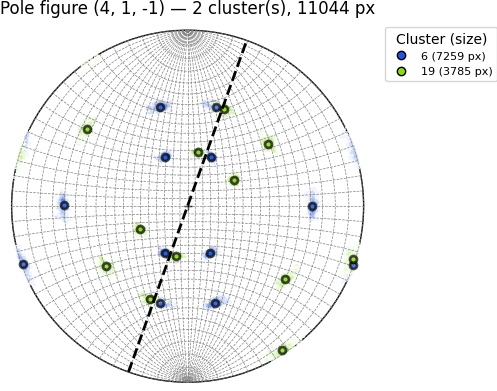

In [21]:
idx = 0
m = matches[idx]

cluster_a_id = m['cluster_a']
cluster_b_id = m['cluster_b']
cluster_ids = [cluster_a_id, cluster_b_id]

G1 = merged_clustering_result.avg_orientations[cluster_a_id]
G2 = merged_clustering_result.avg_orientations[cluster_b_id]
T = m['T']  # the symop found by the T-loop, applied to G1's side only

n1 = m['twin_elements']['n1_a']   # K1's Cartesian normal, already the matched variant
uvw = m['twin_elements']['K1_a']  # Miller indices, same variant (fine as-is: phase A is cubic,
                                   # so Miller ~ Cartesian direction up to scale; plot_cluster_pole_figure
                                   # doesn't apply the phase's L matrix to uvw itself)

# ---- sample-frame pole, computed two ways: from cluster_a (needs T),
#      and from cluster_b (no T needed) -- these should nearly coincide,
#      since that coincidence is exactly what the twin match means
normal_a_raw = G1.T.dot(T.dot(n1))
normal_b_raw = G2.T.dot(n1)

dev = np.degrees(np.arccos(np.clip(abs(normal_a_raw.dot(normal_b_raw)), -1.0, 1.0)))
print(f"Sanity check: cluster_a's and cluster_b's K1 poles agree to {dev:.2f} deg "
      f"(should be close to axis_dev={m['axis_dev_deg']:.2f} deg)")

normal = sample_transform @ normal_a_raw  # or normal_b_raw -- pick either, they nearly coincide

equalarea = False
fig, ax = merged_clustering_result.plot_cluster_pole_figure(
    cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram',
    pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]), 'scale': 'sqrt', 'nlevels': 10},
    avg_plot='symbols', avg_symbol_kwargs={'markersize': 5, 'markerfacecolor': 'r'},
    equalarea=equalarea, hemi='upper', sample_transform=sample_transform
)

if not equalarea:
    trace = stereoprojection_planes(normal, arclength=360., iniangle=0., hemisphere="upper")
else:
    trace = equalarea_planes(normal, arclength=360., iniangle=0., hemisphere="upper")

ax.plot(trace[0, :], trace[1, :], 'k--', lw=2, label='K1 plane trace')

## Plot in the coordinate system with z axis parallel to common <110>

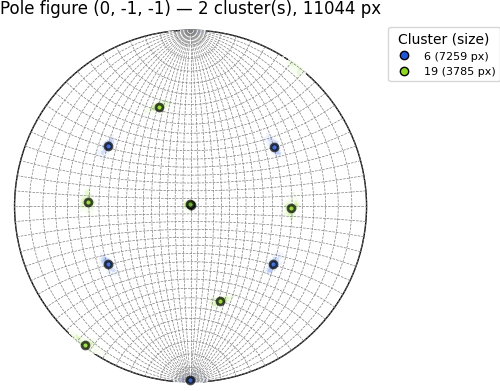

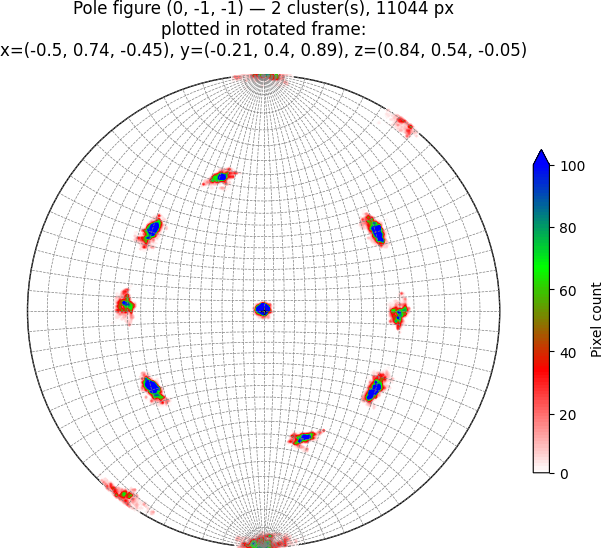

In [22]:
fig, ax = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=zone_axis, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=zone_axis, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 

Plotting Inverse Pole Figure... 0.16 s
Plotting Inverse Pole Figure... 0.14 s


Text(0.5, 1.0, 'Selected clusters')

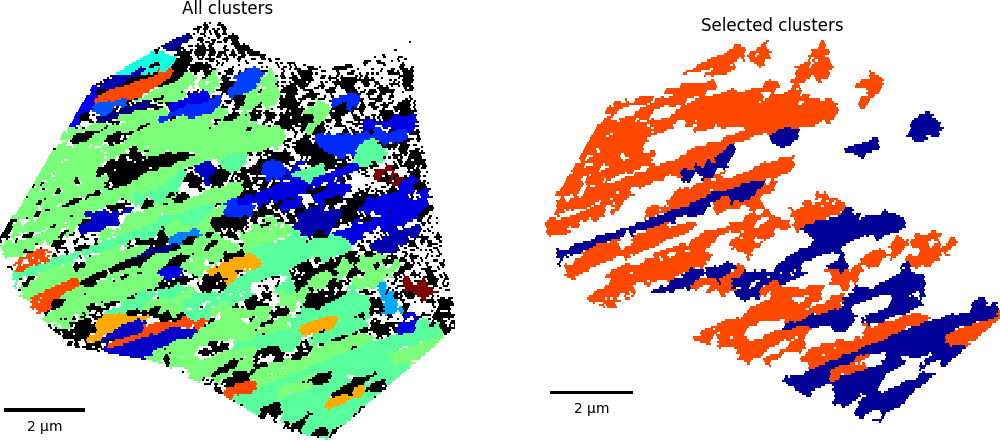

In [23]:
fig,AX = plt.subplots(1,2,figsize=(10,7))
visualizer = EBSDVisualizer()
visualizer.plotClusters(merged_clustering_result, ax=AX[0], tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[0].set_title("All clusters")
visualizer = EBSDVisualizer()
visualizer.plotClusters(merged_clustering_result, ax=AX[1], cluster_id = cluster_ids, tiling=None, roi=recipe['roiID'], phase='A',color_by='cluster',globalScale=False)
AX[1].set_title("Selected clusters")


In [24]:
idxs = [0,4]
cluster_ids = [merged_roots[idx] for idx in idxs]
result = merged_clustering_result.check_twin_relationship(
    cluster_a=cluster_ids[0], cluster_b=cluster_ids[1], system='NiTi', mode='114', tol_deg=5.0
)
print(result)


{'cluster_a': 6, 'cluster_b': 3, 'system': 'NiTi', 'mode': '114', 'is_match': False, 'best_condition': 'eta1_180', 'best_T_idx': 5, 'T': array([[ 0., -1.,  0.],
       [-1.,  0.,  0.],
       [ 0.,  0., -1.]]), 'axis_dev_deg': 17.13362826896222, 'angle_dev_deg': np.float64(1.2503647167880274), 'variant_idx': 8, 'angle_deg': np.float64(178.74963528321197), 'twin_elements': {'K1_a': array([ 1., -1., -4.]), 'K2_a': array([1., 1., 0.]), 'eta1_a': array([ 2., -2.,  1.]), 'eta2_a': array([ 0.,  0., -1.]), 'n1_a': array([ 0.23570226, -0.23570226, -0.94280904]), 'n2_a': array([0.70710678, 0.70710678, 0.        ]), 'a1_a': array([ 0.66666667, -0.66666667,  0.33333333]), 'a2_a': array([ 0.,  0., -1.])}, 'checks': {'K1_180': {'axis_dev_deg': 17.11944480440735, 'angle_dev_deg': np.float64(1.888548327971705), 'is_match': False, 'variant_idx': 8, 'T_idx': 2, 'angle_deg': np.float64(178.1114516720283)}, 'eta1_180': {'axis_dev_deg': 17.13362826896222, 'angle_dev_deg': np.float64(1.2503647167880274), '

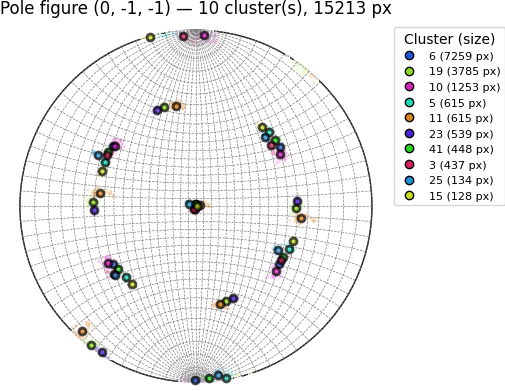

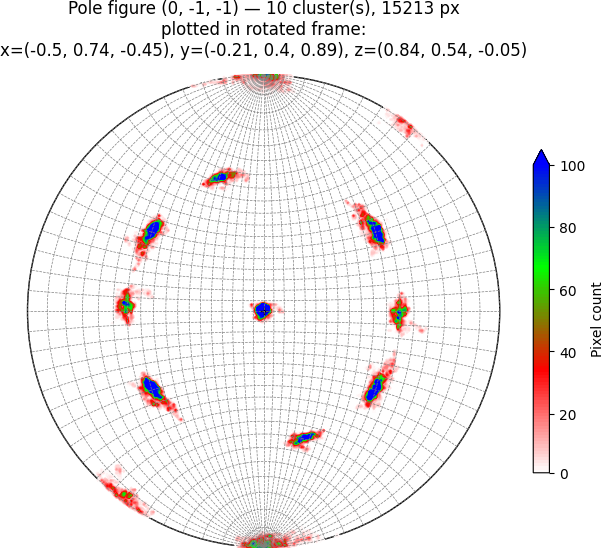

In [25]:
#sample_transform = merged_clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)

fig, ax = merged_clustering_result.plot_cluster_pole_figure(cluster_id=merged_roots, phase='A', uvw=zone_axis, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = merged_clustering_result.plot_cluster_pole_figure(cluster_id=merged_roots, phase='A', uvw=zone_axis, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 

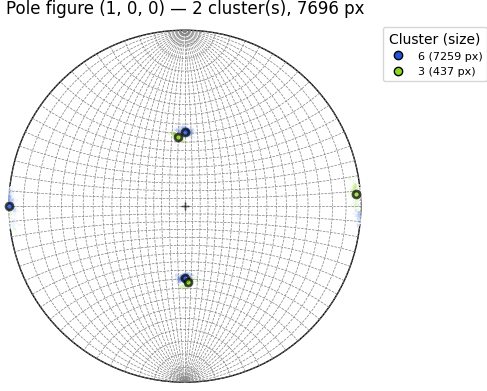

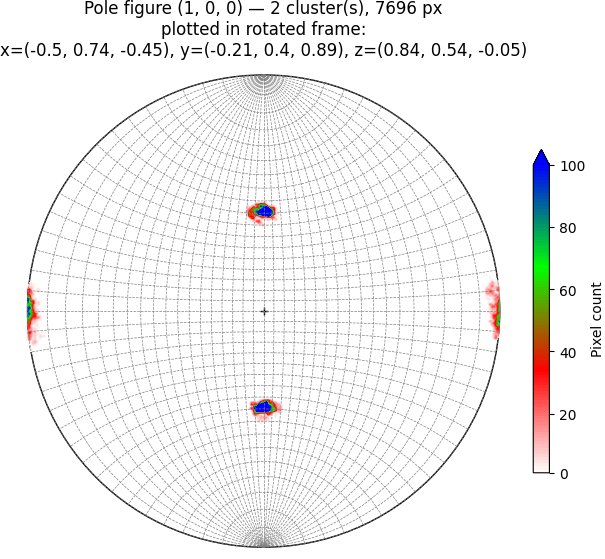

In [26]:
#sample_transform = merged_clustering_result.get_zone_axis_transform(cluster_id=cluster1, uvw=zone_axis)
idxs = [0,4]
cluster_ids = [merged_roots[idx] for idx in idxs]
uvw = [1,0,0]
fig, ax = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram',
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0)]),'scale': 'sqrt', 'nlevels': 10},
avg_plot='symbols', avg_symbol_kwargs={'markersize': 5,'markerfacecolor': 'r'},
equalarea=False,hemi='upper',sample_transform=sample_transform)
fig, ax, results = merged_clustering_result.plot_cluster_pole_figure(cluster_id=cluster_ids, phase='A', uvw=uvw, pixel_plot='histogram', pixel_pooled=True,
pixel_hist_kwargs={'cmap': get_cmap([(1,1,1),(1,0,0),(0,1,0),(0,0,1)]),'scale': 'linear',
                   'nlevels': 100, 'vmax':100.0},
equalarea=False,hemi='upper',sample_transform=sample_transform,return_val=True)
annotate_sample_transform(ax, sample_transform)
fig.set_size_inches(7, 7)
cs = results['pixel']['pooled']['contourf']
cbar = fig.colorbar(cs, ax=ax, fraction=0.046, pad=0.04, shrink=0.6)
cbar.set_label('Pixel count')  # linear -> raw counts, unlike log1p or sqrt(counts)
cbar.ax.set_ylim(0, 100)
cbar.set_ticks([0, 20, 40, 60, 80, 100]) 

# Kink Analysis

## Explicitly input rotation axes

In [59]:
pairs_kink_results_axes, kink_matches_axes = merged_clustering_result.map_kink_relationships(
    phase='A', axes=[[1,1,0], [1,0,0], [1,1,2]], tol_deg=5.0, min_size='recipe',
    print_result=True, sort_by='size',return_all_matches=True
)

   #  Cluster A     Px A  Cluster B     Px B  Axis idx   Axis dev  Kink angle  T_idx  Match
--------------------------------------------------------------------------------------------
   0          6     7259         19     3785         0      0.42°     143.03°     17    yes
   1          6     7259         19     3785         0      1.25°      36.98°      6    yes
   2          6     7259         10     1253         0      0.60°     176.71°     13    yes
   3          6     7259         10     1253         0      1.22°     177.50°      1    yes
   4          6     7259         10     1253         0      1.23°     177.51°     17    yes
   5          6     7259         10     1253         0      1.70°     179.20°      3    yes
   6          6     7259         10     1253         0      1.71°     179.21°     23    yes
   7          6     7259         10     1253         0      1.75°     179.98°      9    yes
   8          6     7259         10     1253         1      1.30°     177.66°  

In [29]:
idx=0
result = merged_clustering_result.check_kink_relationship(
    cluster_a=matches[idx]['cluster_a'], cluster_b=matches[idx]['cluster_b'], phase='A', axes=[[1,1,0], [1,0,0], [1,1,2]], tol_deg=5.0
)
for m in result['all_matches_by_axis'][0]:
    print(f"axis_dev={m['axis_dev_deg']:.2f}°  angle={m['kink_angle_deg']:.2f}°  T_idx={m['T_idx']}")

axis_dev=0.42°  angle=143.03°  T_idx=17
axis_dev=1.25°  angle=36.98°  T_idx=6


## With rotation axis identification

In [30]:
result = merged_clustering_result.identify_kink_axis(
    cluster_a=matches[idx]['cluster_a'], cluster_b=matches[idx]['cluster_b'], phase='A', max_miller_index=3, tol_deg=5.0,
    print_result=True, print_top_n=5#'all'
)

Cluster 6 <-> 19, phase A: 18 total match(es) across 9 distinct families, ranked by (max Miller index, angle)
  #          uvw  max|idx|   Axis dev  Kink angle  T_idx
----------------------------------------------------------
  0  (-1, -1, 0)         1      1.25°      36.98°      6
  1  (-1, -1, 0)         1      0.42°     143.03°     17
  2 (-2, -2, -1)         2      1.22°      91.23°     10
  3 (-2, -2, -1)         2      1.00°      91.58°     18
  4  (-2, -1, 0)         2      1.31°      95.53°     21


## Identify kink among merged clusters

In [51]:
pairs_results_kinks = merged_clustering_result.map_kink_axes(
    phase='A', max_miller_index=2, tol_deg=5.0, min_size='recipe',
    print_result=True, print_top_n_per_pair=1#'all'
    , sort_by='size'
)

136 pair(s) with at least one kink-axis match (tol_deg=5.0, max_miller_index=2)

Cluster 6 (7259 px) <-> 19 (3785 px): 7 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      1.25°      36.98°      6

Cluster 6 (7259 px) <-> 10 (1253 px): 24 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.88°      87.69°     19

Cluster 5 (615 px) <-> 6 (7259 px): 13 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      4.15°      10.14°      6

Cluster 6 (7259 px) <-> 11 (615 px): 7 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      3.05°      42.23°      0

Cluster 6 (7259 px) <-> 23 (539 px): 7 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      0.92°      32.67°     22

Cluster 6 (7259 px) <-> 41 (448 px): 23 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      2

## Identify kink among nonmerged clusters

In [52]:
notmerged_pairs_results_kinks = clustering_result.map_kink_axes(
    phase='A', max_miller_index=2, tol_deg=5.0, min_size='recipe',
    print_result=True, print_top_n_per_pair=1#'all'
    , sort_by='size'
)

2080 pair(s) with at least one kink-axis match (tol_deg=5.0, max_miller_index=2)

Cluster 7 (2754 px) <-> 28 (1413 px): 24 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.11°      88.47°      1

Cluster 7 (2754 px) <-> 59 (1380 px): 7 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      2.45°      36.86°     10

Cluster 7 (2754 px) <-> 52 (913 px): 23 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.44°      87.74°     10

Cluster 7 (2754 px) <-> 37 (833 px): 7 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      3.43°      36.57°     10

Cluster 7 (2754 px) <-> 27 (488 px): 23 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.46°      87.28°     12

Cluster 7 (2754 px) <-> 22 (459 px): 23 match(es)
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      

# Boundary analysis

In [32]:
analyzer = BoundaryAnalyzer()
boundary_result = analyzer.analyze(clustering_result)

## Identify twin-related clusters sharing a boundary among merged clusters

In [61]:
boundary_sharing_pairs_results, boundary_sharing_matches = merged_clustering_result.find_boundary_sharing_twins(
    boundary_result, merge_groups_all,
    phase='A', system='NiTi', modes=['115','114','113','112','111'],
    tol_deg=5.0, min_size='recipe', sort_by='size', print_result=True
)

   #  Cluster A     Px A  Cluster B     Px B     Mode                   Conditions   Axis dev  Angle dev  Match  Boundary  Bnd px
--------------------------------------------------------------------------------------------------------------------------------------------
   0          6     7259         19     3785      114     K1_180+eta1_180+K2_shear      1.05°      0.25°    yes       yes     700
   1          6     7259         11      615      114     K1_180+eta1_180+K2_shear      1.90°      0.95°    yes       yes      68
   2          6     7259         23      539      115     K1_180+eta1_180+K2_shear      0.59°      0.20°    yes       yes      83
   3          2      142          6     7259      115              K1_180+eta1_180      1.96°      0.95°    yes        no       0
   4          6     7259         49       83      114              K1_180+eta1_180      2.14°      0.35°    yes       yes       6
   5          6     7259         13       69      115              K1_180+eta1_

In [67]:
63-17

46

## Identify kink-related clusters sharing a boundary among merged clusters

In [55]:
boundary_sharing_kink_results = merged_clustering_result.find_boundary_sharing_kinks(
    boundary_result, merge_groups_all, phase='A',
    max_miller_index=2, tol_deg=5.0, min_size='recipe',
    sort_by='size', print_result=True,print_top_n_per_pair='all'
)

136 pair(s) with at least one kink-axis match (tol_deg=5.0, max_miller_index=2), 30 sharing a physical boundary

Cluster 6 (7259 px) <-> 19 (3785 px): 7 match(es), boundary=700px
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      1.25°      36.98°      6
  (-1, -1, 0)         1      0.42°     143.03°     17
  (-2, -2, -1)         2      1.22°      91.23°     10
  (-2, -2, -1)         2      1.00°      91.58°     18
  (-2, -1, 0)         2      1.31°      95.53°     21

Cluster 6 (7259 px) <-> 10 (1253 px): 24 match(es), boundary=32px
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.88°      87.69°     19
  (-1, 0, 0)         1      1.90°      87.72°      5
  (-1, 0, 0)         1      2.35°      88.85°     11
  (-1, 0, 0)         1      2.30°      91.25°     15
  (-1, 0, 0)         1      1.82°      92.34°      7

Cluster 5 (615 px) <-> 6 (7259 px): 13 match(es), boundary=84px
         uvw  max|idx|   Axis dev  Kink angle 

## Identify twins sharing a boundary among not merged clusters

In [56]:
notmerged_boundary_sharing_boundary_pairs_results, notmerged_boundary_sharing_boundary_matches = clustering_result.find_boundary_sharing_twins(
    boundary_result, phase='A', system='NiTi', modes=['115','114','113','112','111'],
    tol_deg=5.0, min_size='recipe', sort_by='size', print_result=True
)

   #  Cluster A     Px A  Cluster B     Px B     Mode                   Conditions   Axis dev  Angle dev  Match  Boundary  Bnd px
--------------------------------------------------------------------------------------------------------------------------------------------
   0          7     2754         59     1380      114     K1_180+eta1_180+K2_shear      1.31°      0.23°    yes        no       0
   1          7     2754         37      833      114     K1_180+eta1_180+K2_shear      1.62°      0.26°    yes        no       0
   2          7     2754         30      397      114     K1_180+eta1_180+K2_shear      0.83°      0.06°    yes        no       0
   3          7     2754         48      357      114     K1_180+eta1_180+K2_shear      0.79°      0.55°    yes        no       0
   4          7     2754         60      245      115     K1_180+eta1_180+K2_shear      0.80°      0.68°    yes        no       0
   5          7     2754         53      242      114     K1_180+eta1_180+K2_sh

## Identify kinks sharing a boundary among not merged clusters

In [57]:
notmerged_boundary_sharing_boundary_kink_results = clustering_result.find_boundary_sharing_kinks(
    boundary_result, phase='A', max_miller_index=2, tol_deg=5.0, min_size=500,
    sort_by='size', print_result=True
)

10 pair(s) with at least one kink-axis match (tol_deg=5.0, max_miller_index=2), 1 sharing a physical boundary

Cluster 7 (2754 px) <-> 28 (1413 px): 24 match(es), no boundary
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.11°      88.47°      1
  (-1, 0, 0)         1      1.23°      88.67°     11
  (-1, 0, 0)         1      1.45°      89.24°     17

Cluster 7 (2754 px) <-> 59 (1380 px): 7 match(es), no boundary
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, -1, 0)         1      2.45°      36.86°     10
  (-1, -1, 0)         1      0.82°     143.18°     13
  (-2, -2, -1)         2      1.82°      90.44°      4

Cluster 7 (2754 px) <-> 52 (913 px): 23 match(es), no boundary
         uvw  max|idx|   Axis dev  Kink angle  T_idx
  (-1, 0, 0)         1      1.44°      87.74°     10
  (-1, 0, 0)         1      1.84°      88.42°      0
  (-1, 0, 0)         1      1.99°      88.86°     22

Cluster 7 (2754 px) <-> 37 (833 px): 7 match(es), no bou

# Statistics

In [72]:
stats = merged_clustering_result.summarize_relationship_statistics(
    phase='A', matches=boundary_sharing_matches, kink_results=boundary_sharing_kink_results
)

Phase 'A': 17 cluster(s), 15804 total clustered pixels

Twin relationship:
    shares boundary                       :   14 cluster(s),   15496 px (98.05%)
    no boundary (matched, not touching)   :    2 cluster(s),     258 px (1.63%)
    no relationship                       :    1 cluster(s),      50 px (0.32%)

  Total eligible clusters: 17
  Distinct clusters appearing across all 63 matched pairs: 16
  Clusters in matches but NOT in the eligible set (should be empty): set()
  Eligible clusters that appear in NO match at all: {np.int32(1)}

  Max possible pairs among 17 clusters: C(17,2) = 136
  Actual matched pairs: 63 (46.3% of all possible combinations)

Kink relationship:
    shares boundary                       :   16 cluster(s),   15754 px (99.68%)
    no boundary (matched, not touching)   :    1 cluster(s),      50 px (0.32%)
    no relationship                       :    0 cluster(s),       0 px (0.00%)

  Total eligible clusters: 17
  Distinct clusters appearing across al

In [73]:
notmerged_stats = clustering_result.summarize_relationship_statistics(
    phase='A', matches=notmerged_boundary_sharing_boundary_matches, kink_results=notmerged_boundary_sharing_boundary_kink_results
)

Phase 'A': 65 cluster(s), 15804 total clustered pixels

Twin relationship:
    shares boundary                       :   53 cluster(s),   14731 px (93.21%)
    no boundary (matched, not touching)   :   11 cluster(s),    1023 px (6.47%)
    no relationship                       :    1 cluster(s),      50 px (0.32%)

  Total eligible clusters: 65
  Distinct clusters appearing across all 975 matched pairs: 64
  Clusters in matches but NOT in the eligible set (should be empty): set()
  Eligible clusters that appear in NO match at all: {np.int32(1)}

  Max possible pairs among 65 clusters: C(65,2) = 2080
  Actual matched pairs: 975 (46.9% of all possible combinations)

Kink relationship:
    shares boundary                       :    2 cluster(s),    1746 px (11.05%)
    no boundary (matched, not touching)   :    3 cluster(s),    5547 px (35.10%)
    no relationship                       :   60 cluster(s),    8511 px (53.85%)

  Total eligible clusters: 65
  Distinct clusters appearing acro

/home/lheller/Documents/GitHub/ebsdlib/ebsdlib.py:6982: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax : matplotlib Figure, Axes


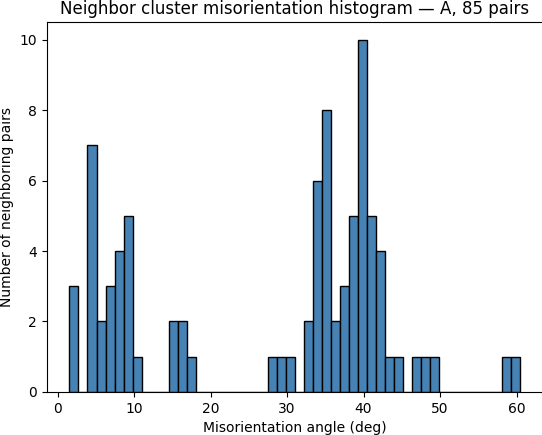

In [36]:
fig, ax = clustering_result.plot_neighbor_cluster_misorientation_histogram(
    boundary_result, phase='A', bins=50, min_size='recipe',facecolor='steelblue', edgecolor='black'
)

Text(0.5, 1.0, 'Merged clusters\nNeighbor cluster misorientation histogram — A, 30 pairs')

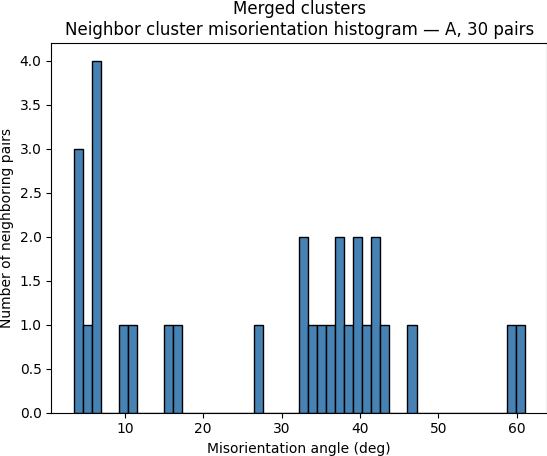

In [37]:
fig, ax = merged_clustering_result.plot_neighbor_cluster_misorientation_histogram(
    boundary_result, phase='A', bins=50, min_size='recipe',facecolor='steelblue', edgecolor='black',merge_groups_all=merge_groups_all, 
)
existing_title = ax.get_title()
ax.set_title(f"Merged clusters\n{existing_title}")

Text(0.5, 1.0, 'Merged clusters except for twin pairs\nNeighbor cluster misorientation histogram — A, 13 pairs, 63 pair(s) excluded')

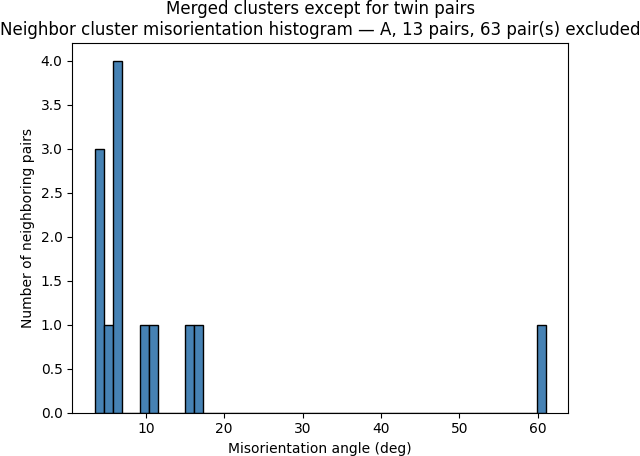

In [38]:
fig, ax = merged_clustering_result.plot_neighbor_cluster_misorientation_histogram(
    boundary_result, phase='A', bins=50, min_size='recipe',facecolor='steelblue', edgecolor='black',merge_groups_all=merge_groups_all,exclude_pairs=matches 
)
existing_title = ax.get_title()
ax.set_title(f"Merged clusters except for twin pairs\n{existing_title}")

Text(0.5, 1.0, 'Merged clusters including only twin pairs\nNeighbor cluster misorientation histogram — A, 17 pairs, restricted to 63 pair(s)')

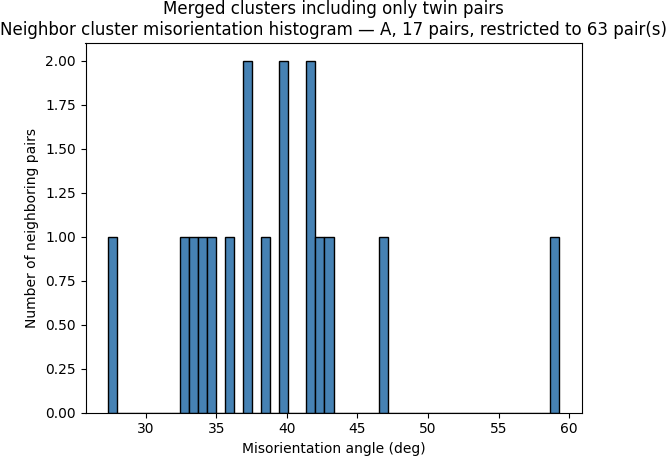

In [39]:
fig, ax = merged_clustering_result.plot_neighbor_cluster_misorientation_histogram(
    boundary_result, phase='A', bins=50, min_size='recipe',facecolor='steelblue', edgecolor='black',merge_groups_all=merge_groups_all,include_pairs=matches 
)
existing_title = ax.get_title()
ax.set_title(f"Merged clusters including only twin pairs\n{existing_title}")

Text(0.5, 1.0, 'Merged clusters including only kink pairs\nNeighbor cluster misorientation histogram — A, 30 pairs, restricted to 136 pair(s)')

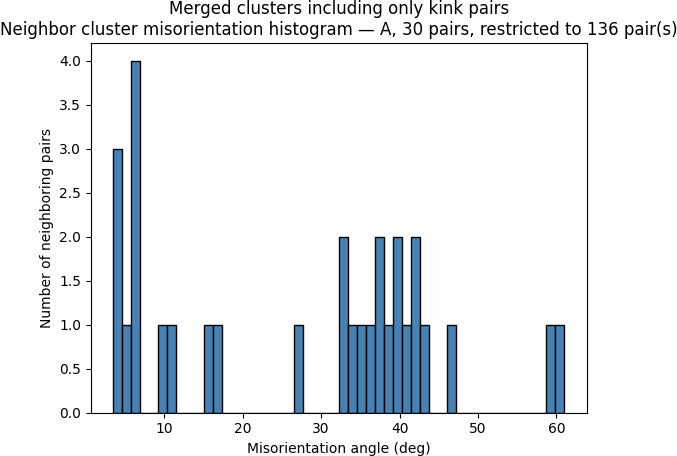

In [40]:
fig, ax = merged_clustering_result.plot_neighbor_cluster_misorientation_histogram(
    boundary_result, phase='A', bins=50, min_size='recipe',facecolor='steelblue', edgecolor='black',merge_groups_all=merge_groups_all,include_pairs=kink_results 
)
existing_title = ax.get_title()
ax.set_title(f"Merged clusters including only kink pairs\n{existing_title}")

No same-phase neighboring cluster pairs found for phase 'A' (after inclusion/exclusion filters, if any).


Text(0.5, 1.0, 'Merged clusters except for kink and twin pairs\n')

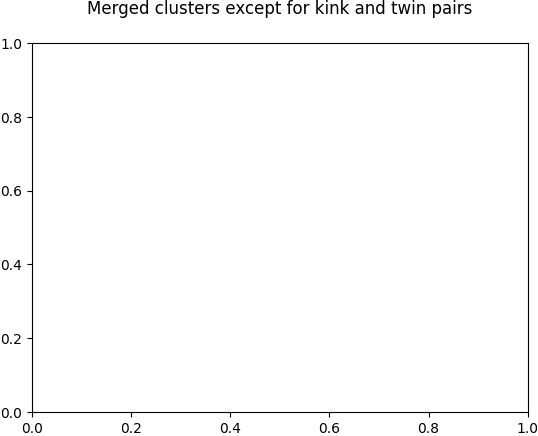

In [41]:
fig, ax = merged_clustering_result.plot_neighbor_cluster_misorientation_histogram(
    boundary_result, phase='A', bins=50, min_size='recipe',facecolor='steelblue', edgecolor='black',merge_groups_all=merge_groups_all,exclude_pairs=[matches,kink_results]
)
existing_title = ax.get_title()
ax.set_title(f"Merged clusters except for kink and twin pairs\n{existing_title}")

# GND, KAM

In [56]:
# --- KAM / GND -----------------------------------------------------------

kg = KamGND(distance=k['distance'], perimeteronly=k['perimeteronly'],
            maxmis=k['maxmis'], roi=recipe['roiID'], cluster_id=None)
clustering_result = kg.computeKAM(clustering_result)
clustering_result = kg.computeGND(clustering_result)

Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 7.34 s
Calculating misorientations for 34378 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 0.43 s
Calculating misorientations for 143909 points for 6 neighbors [1, 2, 3, 4, 5, 6] in 1.87 s
Calculating misorientations for 143909 points for 12 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] in 4.10 s
Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 6.89 s
Calculating misorientations for 143909 points for 24 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24] in 8.85 s
Calculating misorientations for 143909 points for 30 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30] in 12.73 s
Calculating misorientations for 34378 p

Plotting Inverse Pole Figure... 0.14 s
Plotting Inverse Pole Figure... 0.06 s


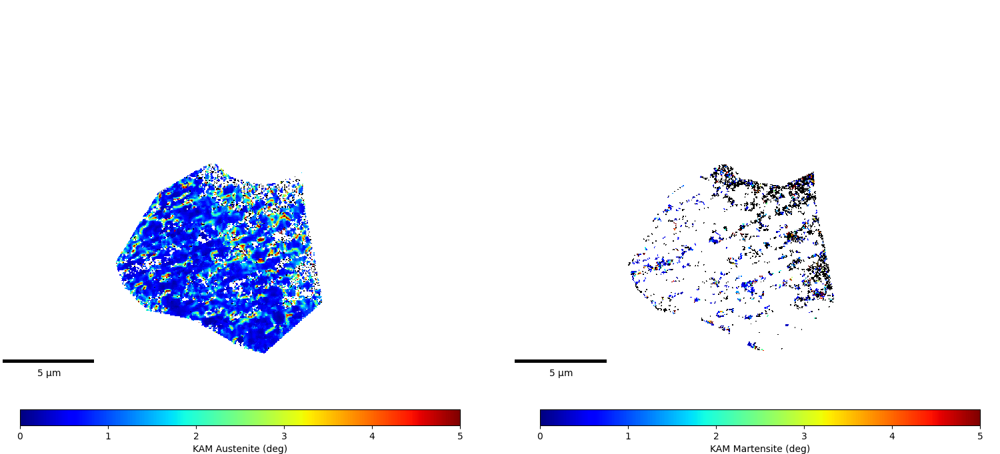

In [57]:
fig,AX = plt.subplots(1,2,figsize=(15,8))
fig.subplots_adjust(wspace=0.05)
visualizer = EBSDVisualizer()
ax_pos=[[0.02, 0.06, 0.44, 0.03],[0.54, 0.06, 0.44, 0.03]]
Vv = [None,None]
Vv = [[0,5],[0,5]]
for ax, phase,xp,label,V in zip(AX, ['A', 'M'],ax_pos,['KAM Austenite (deg)','KAM Martensite (deg)'],Vv):
    
    if V is None:
        vmin=float(np.nanmin(clustering_result.data.kam))
        vmax=float(np.nanmax(clustering_result.data.kam))
    else:   
        vmin=V[0]
        vmax=V[1]

    visualizer.plotClusters(clustering_result, ax=ax, fig=fig,
                             globalScale=True, tiling=None, roi=recipe['roiID'],
                             phase=phase, vmin=vmin,vmax=vmax,color_by='KAM')
    
    norm = mcolors.Normalize(
        vmin=vmin,
        vmax=vmax)
    sm = cm.ScalarMappable(cmap='jet', norm=norm)
    sm.set_array([])
    cax = fig.add_axes(xp)
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    cbar.set_label(label, fontsize=10)
    #fig.colorbar(sm, ax=ax, fraction=0.04, pad=0.04,
    #             label='KAM (deg)')

In [58]:
clustering_result = kg.computeGND(clustering_result)

Calculating misorientations for 143909 points for 6 neighbors [1, 2, 3, 4, 5, 6] in 1.62 s
Calculating misorientations for 143909 points for 12 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] in 4.05 s
Calculating misorientations for 143909 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] in 6.60 s
Calculating misorientations for 143909 points for 24 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24] in 8.76 s
Calculating misorientations for 143909 points for 30 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30] in 11.90 s
Calculating misorientations for 34378 points for 6 neighbors [1, 2, 3, 4, 5, 6] in 0.12 s
Calculating misorientations for 34378 points for 12 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12] in 0.26 s
Calculating misorientations for 34378 points for 18 neighbors [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 

Plotting Inverse Pole Figure... 

0.10 s
Plotting Inverse Pole Figure... 0.05 s


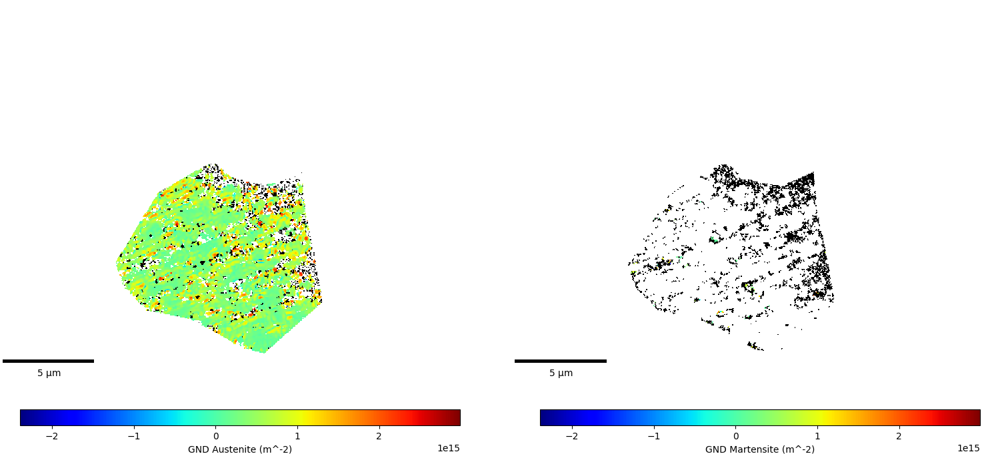

In [59]:
fig,AX = plt.subplots(1,2,figsize=(15,8))
fig.subplots_adjust(wspace=0.05)
visualizer = EBSDVisualizer()
ax_pos=[[0.02, 0.06, 0.44, 0.03],[0.54, 0.06, 0.44, 0.03]]
Vv = [None,None]
#Vv = [[0,5],[0,5]]
for ax, phase,xp,label,V in zip(AX, ['A', 'M'],ax_pos,['GND Austenite (m^-2)','GND Martensite (m^-2)'],Vv):
    
    if V is None:
        vmin=float(np.nanmin(clustering_result.data.GND))
        vmax=float(np.nanmax(clustering_result.data.GND))
    else:   
        vmin=V[0]
        vmax=V[1]

    visualizer.plotClusters(clustering_result, ax=ax, fig=fig,
                             globalScale=True, tiling=None, roi=recipe['roiID'],
                             phase=phase, vmin=vmin,vmax=vmax,color_by='GND')
    
    norm = mcolors.Normalize(
        vmin=vmin,
        vmax=vmax)
    sm = cm.ScalarMappable(cmap='jet', norm=norm)
    sm.set_array([])
    cax = fig.add_axes(xp)
    cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
    cbar.set_label(label, fontsize=10)
    #fig.colorbar(sm, ax=ax, fraction=0.04, pad=0.04,
    #             label='KAM (deg)')

# Save data

In [ ]:
fileext = '2grains_selection_checkpoint'
if 'ang' in RECIPE['filename']:
    checkpoint_path = RECIPE['filename'].replace('.ang',f'_{fileext}.h5')
elif 'oh5' in RECIPE['filename']:
    checkpoint_path = RECIPE['filename'].replace('.oh5',f'_{fileext}.h5')

save_checkpoint(
    checkpoint_path,
    clustering_result=clustering_result,
    boundary_result=boundary_result,
    hierarchy=None,          # pass your hierarchy object if you have one
    hpa=None,                # pass your EbsdHPAnalyzer instance if you have one
    recipe=recipe,           # your recipe dict (filename, cif paths, roi_verts, etc.)
    or_results=None,         # optional
    aux={'merge_groups_all': merge_groups_all},  # anything extra you want preserved
)

checkpoint saved -> /home/lheller/DATA/ebsd/racim/def30/R18SA-30def-500CEpulse-center-Area1_Rescan_2grains_selection_checkpoint.h5
